In [1]:
%reload_ext autoreload
%autoreload 2

In [2]:
import spyglass as nd
import pandas as pd
# ignore datajoint+jupyter async warnings
import warnings
warnings.simplefilter('ignore', category=DeprecationWarning)
warnings.simplefilter('ignore', category=ResourceWarning)

Connecting shijiegu@lmf-db.cin.ucsf.edu:3306


In [3]:
import matplotlib.pyplot as plt
import numpy as np
import xarray as xr
import logging
import cupy as cp

FORMAT = '%(asctime)s %(message)s'

logging.basicConfig(level='INFO', format=FORMAT, datefmt='%d-%b-%y %H:%M:%S')

In [45]:
from spyglass.common import (Session, IntervalList,IntervalPositionInfo,
                             LabMember, LabTeam, Raw, Session, Nwbfile,
                            Electrode,LFPBand,interval_list_intersect)
from spyglass.common.common_interval import _intersection

import spyglass.spikesorting as ss
from spyglass.spikesorting import (SortGroup, 
                                    SortInterval,
                                    SpikeSortingPreprocessingParameters,
                                    SpikeSortingRecording, 
                                    SpikeSorterParameters,
                                    SpikeSortingRecordingSelection,
                                    ArtifactDetectionParameters, ArtifactDetectionSelection,
                                    ArtifactRemovedIntervalList, ArtifactDetection,
                                      SpikeSortingSelection, SpikeSorting,
                                   CuratedSpikeSortingSelection,CuratedSpikeSorting,Curation)
from spyglass.decoding.clusterless import (UnitMarks,
                                           UnitMarkParameters,UnitMarksIndicatorSelection,
                                          UnitMarksIndicator)
from spyglass.common.nwb_helper_fn import get_nwb_copy_filename
from spyglass.common.common_position import IntervalPositionInfo, IntervalPositionInfoSelection
from spyglass.Analysis_SGU import TrialChoice,Decode

In [5]:
nwb_copy_file_name = 'molly20220416_.nwb'

In [6]:
def interval_union(interval_list1,interval_list2):
    '''
    interval_list1 : np.array, (N,2) where N = number of intervals
    interval_list2 : np.array, (N,2) where N = number of intervals
    
    e.g.
    interval_list1 = np.array([[1,11],[6,8],[12,20],[25,30]])
    interval_list2 = np.array([[1,10]])
    
    Returns
    -------
    interval_list: np.array, (N,2)

    '''
    interval_list1=interval_list1.tolist()
    interval_list2=interval_list2.tolist()
    
    # find all pairwise intersections
    intersect_tally=np.zeros((len(interval_list1),len(interval_list2)))
    for i in range(len(interval_list1)):
        for j in range(len(interval_list2)):
            if _intersection(interval_list1[i],interval_list2[j]) is not None:
                intersect_tally[i,j]=1

    union_set=[]
    union_list2_ind=np.argwhere(np.sum(intersect_tally,axis=0)==0).ravel()
    union_list1_ind=np.argwhere(np.sum(intersect_tally,axis=1)==0).ravel()

    # for those in set 1 or set 2 that has no intersections, append zero row sum or column sum 
    for i in union_list1_ind:
        union_set.append(interval_list1[i])
    for i in union_list2_ind:
        union_set.append(interval_list2[i])
    
    # for those that has intersections, find mutually intersecting interva;s
    for i in np.argwhere(np.sum(intersect_tally,axis=1)!=0).ravel():
        intvl_1=np.array([interval_list1[i]])
        
        intvl_1s=[]
        # first, find the intersecting one in set 2
        j_all=np.argwhere(intersect_tally[i,:]).ravel()
        intvl_2s=np.array([interval_list2[j] for j in j_all])
        
        # then track back in set 1, to find all the ones in set 1 intersecting this one in set 2
        for j in j_all:
            i_all=np.argwhere(intersect_tally[:,j]).ravel()
            for i in i_all:
                intvl_1s.append(interval_list1[i])
        
        # put all the related/intersecting intervals together, find union
        union_tmp=np.concatenate([np.array(intvl_1s),intvl_2s],axis=0)
        
        union_set.append([np.min(union_tmp[:,0]),np.max(union_tmp[:,1])])
    union_set=np.unique(union_set,axis=0)   
    return union_set

In [7]:
def populate_mark_indicators(
        spikesorting_selection_keys: list,
        mark_param_name='default',
        position_info_param_name='default'
):
    # Populate spike sorting
    SpikeSortingSelection().insert(
        spikesorting_selection_keys,
        skip_duplicates=True,
    )
    SpikeSorting.populate(spikesorting_selection_keys)

    # Skip any curation
    curation_keys = [Curation.insert_curation(
        key) for key in spikesorting_selection_keys]

    CuratedSpikeSortingSelection().insert(
        curation_keys,
        skip_duplicates=True
    )
    CuratedSpikeSorting.populate(
        CuratedSpikeSortingSelection() & curation_keys)

    # Populate marks
    mark_parameters_keys = pd.DataFrame(CuratedSpikeSorting & curation_keys)
    mark_parameters_keys['mark_param_name'] = mark_param_name
    mark_parameters_keys = (mark_parameters_keys
                            .loc[:, UnitMarkParameters.primary_key]
                            .to_dict('records'))
    UnitMarkParameters().insert(
        mark_parameters_keys,
        skip_duplicates=True
    )
    UnitMarks.populate(UnitMarkParameters & mark_parameters_keys)

    # Compute mark indicators for each position epoch
    nwb_file_name = spikesorting_selection_keys[0]['nwb_file_name']
    position_interval_names = (IntervalPositionInfo() & {
        'nwb_file_name': nwb_file_name,
        'position_info_param_name': position_info_param_name
    }).fetch('interval_list_name')

    for interval_name in tqdm(position_interval_names):
        position_interval = (
            IntervalList &
            {'nwb_file_name': nwb_file_name,
             'interval_list_name': interval_name})

        marks_selection = ((UnitMarks & mark_parameters_keys) *
                           position_interval)
        marks_selection = (pd.DataFrame(marks_selection)
                           .loc[:, marks_selection.primary_key]
                           .to_dict('records'))
        UnitMarksIndicatorSelection.insert(
            marks_selection, skip_duplicates=True)
        UnitMarksIndicator.populate(marks_selection)

## Marks

The first thing we need are the marks for the clusterless decoding. First, sort spikes by thresholder.


### artifact times

In [8]:
ArtifactDetection & {'nwb_file_name':nwb_copy_file_name}

nwb_file_name name of the NWB file,sort_group_id identifier for a group of electrodes,sort_interval_name name for this interval,preproc_params_name,team_name,artifact_params_name,artifact_times np array of artifact intervals,artifact_removed_valid_times np array of valid no-artifact intervals,artifact_removed_interval_list_name name of the array of no-artifact valid time intervals
molly20220416_.nwb,3,02_Seq2Session1,franklab_tetrode_hippocampus,Shijie Gu,ampl_1500_prop_075_1ms,=BLOB=,=BLOB=,molly20220416_.nwb02_Seq2Session1_all_franklab_tetrode_hippocampus_ampl_100_prop_05_2ms_artifact_removed_valid_times
molly20220416_.nwb,100,02_Seq2Session1,franklab_tetrode_hippocampus,Shijie Gu,ampl_100_prop_05_2ms,=BLOB=,=BLOB=,molly20220416_.nwb_02_Seq2Session1_100_franklab_tetrode_hippocampus_ampl_100_prop_05_2ms_artifact_removed_valid_times
molly20220416_.nwb,100,02_Seq2Session1,franklab_tetrode_hippocampus,Shijie Gu,ampl_150_prop_04_2ms,=BLOB=,=BLOB=,molly20220416_.nwb_02_Seq2Session1_100_franklab_tetrode_hippocampus_ampl_150_prop_04_2ms_artifact_removed_valid_times
molly20220416_.nwb,100,02_Seq2Session1,franklab_tetrode_hippocampus,Shijie Gu,ampl_50_prop_05_2ms,=BLOB=,=BLOB=,molly20220416_.nwb_02_Seq2Session1_100_franklab_tetrode_hippocampus_ampl_50_prop_05_2ms_artifact_removed_valid_times
molly20220416_.nwb,100,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,ampl_100_prop_05_2ms,=BLOB=,=BLOB=,molly20220416_.nwb_04_Seq2Session2_100_franklab_tetrode_hippocampus_ampl_100_prop_05_2ms_artifact_removed_valid_times
molly20220416_.nwb,101,02_Seq2Session1,franklab_tetrode_hippocampus,Shijie Gu,ampl_100_prop_05_2ms,=BLOB=,=BLOB=,molly20220416_.nwb_02_Seq2Session1_101_franklab_tetrode_hippocampus_ampl_100_prop_05_2ms_artifact_removed_valid_times
molly20220416_.nwb,101,02_Seq2Session1,franklab_tetrode_hippocampus,Shijie Gu,ampl_150_prop_04_2ms,=BLOB=,=BLOB=,molly20220416_.nwb_02_Seq2Session1_101_franklab_tetrode_hippocampus_ampl_150_prop_04_2ms_artifact_removed_valid_times
molly20220416_.nwb,101,02_Seq2Session1,franklab_tetrode_hippocampus,Shijie Gu,ampl_50_prop_05_2ms,=BLOB=,=BLOB=,molly20220416_.nwb_02_Seq2Session1_101_franklab_tetrode_hippocampus_ampl_50_prop_05_2ms_artifact_removed_valid_times
molly20220416_.nwb,101,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,ampl_100_prop_05_2ms,=BLOB=,=BLOB=,molly20220416_.nwb_04_Seq2Session2_101_franklab_tetrode_hippocampus_ampl_100_prop_05_2ms_artifact_removed_valid_times


In [9]:
def thresholder_sort(sort_interval_name):
    artifact_params_name='ampl_100_prop_05_2ms'
    #sort_interval_name='04_Seq2Session2'

    artifact_key=(ArtifactDetection() & {'nwb_file_name' : nwb_copy_file_name} 
                              & {'artifact_params_name': artifact_params_name}
                              & {'sort_interval_name':sort_interval_name})
    # fetch, and there should be 2 entries, one from left cannula (group 100), and one from right cannula (group 101)
    artifact_removed_name_list=artifact_key.fetch('artifact_removed_interval_list_name')
    assert len(artifact_removed_name_list)==2

    artifact_time_list=[]
    artifact_removed_time_list=[]
    for artifact_removed_name in artifact_removed_name_list:
        artifact_time_list.append((ArtifactDetection() & {'nwb_file_name' : nwb_copy_file_name,'artifact_removed_interval_list_name':artifact_removed_name}).fetch1('artifact_times'))
        artifact_removed_time_list.append((IntervalList() & {'nwb_file_name' : nwb_copy_file_name,'interval_list_name':artifact_removed_name}).fetch1('valid_times'))

    artifact_time_list=interval_union(artifact_time_list[0],artifact_time_list[1])
    artifact_removed_time_list=interval_list_intersect(artifact_removed_time_list[0],artifact_removed_time_list[1])
    
    # find tetrodes
    tetrode_with_cell=np.unique((SpikeSortingRecordingSelection & {'nwb_file_name':nwb_copy_file_name}).fetch('sort_group_id'))
    tetrode_with_cell=np.setdiff1d(tetrode_with_cell,[100,101])
    
    # insert into individual tetrodes ArtifactRemovedIntervalList
    artifact_params_name='ampl_1500_prop_075_1ms'
    sorting_keys=[]
    for tetrode in tetrode_with_cell:
        print(tetrode)
        artifact_key = {'nwb_file_name' : nwb_copy_file_name,
                    'sort_interval_name' : sort_interval_name,
                    'sort_group_id' : tetrode,
                    'preproc_params_name': 'franklab_tetrode_hippocampus',
                    'team_name': 'Shijie Gu'}                    
        artifact_key['artifact_params_name'] = artifact_params_name

        ArtifactDetectionSelection.insert1(artifact_key, skip_duplicates=True)

        artifact_key['artifact_times']=artifact_time_list
        artifact_key['artifact_removed_valid_times']=artifact_removed_time_list

        artifact_name=(nwb_copy_file_name+'_'+sort_interval_name+'_'+str(artifact_key['sort_group_id'])+'_'+
                       artifact_key['preproc_params_name']+'_'+artifact_params_name+'_artifact_removed_valid_times')

        artifact_key['artifact_removed_interval_list_name']=artifact_name

        ArtifactRemovedIntervalList().insert1(artifact_key,skip_duplicates=True)

        IntervalList().insert1({'nwb_file_name' : nwb_copy_file_name,
                               'interval_list_name':artifact_name,
                               'valid_times':artifact_removed_time_list},skip_duplicates=True)

        artifact_key.pop('artifact_params_name')
        artifact_key.pop('artifact_times')
        artifact_key.pop('artifact_removed_valid_times')

        artifact_key['sorter'] = 'clusterless_thresholder'
        artifact_key['sorter_params_name'] = 'default'

        SpikeSortingSelection.insert1(artifact_key, skip_duplicates=True)

        sorting_keys.append(artifact_key.copy())
    
    # populate
    SpikeSorting.populate({'nwb_file_name':nwb_copy_file_name,
                    'artifact_params_name': artifact_params_name, # make sure to inlude this
                    'sort_interval_name':sort_interval_name})
    return sorting_keys

In [11]:
sort_interval_name='04_Seq2Session2'
sorting_keys=thresholder_sort(sort_interval_name)

0
2
3
6
7
9
10
12
15
17
18
25
27
28
34
36
37
39
40
41
46
50
53
55
57
60
61
62


15-Jun-22 21:51:34 Found 7 keys to populate
15-Jun-22 21:51:34 Transaction started
15-Jun-22 21:51:34 Populating: {'nwb_file_name': 'molly20220416_.nwb', 'sort_group_id': 0, 'sort_interval_name': '04_Seq2Session2', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220416_.nwb_04_Seq2Session2_0_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}


Running spike sorting on {'nwb_file_name': 'molly20220416_.nwb', 'sort_group_id': 0, 'sort_interval_name': '04_Seq2Session2', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220416_.nwb_04_Seq2Session2_0_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}...
Saving sorting results...


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/tempfile.py:818: ResourceWarning: Implicitly cleaning up <TemporaryDirectory '/stelmo/nwb/tmp/tmpfdhrlhw0'>
  _warnings.warn(warn_message, ResourceWarning)
15-Jun-22 21:51:47 Transaction committed and closed.
15-Jun-22 21:51:47 Transaction started
15-Jun-22 21:51:47 Populating: {'nwb_file_name': 'molly20220416_.nwb', 'sort_group_id': 2, 'sort_interval_name': '04_Seq2Session2', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220416_.nwb_04_Seq2Session2_2_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}


Running spike sorting on {'nwb_file_name': 'molly20220416_.nwb', 'sort_group_id': 2, 'sort_interval_name': '04_Seq2Session2', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220416_.nwb_04_Seq2Session2_2_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}...
Saving sorting results...


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/tempfile.py:818: ResourceWarning: Implicitly cleaning up <TemporaryDirectory '/stelmo/nwb/tmp/tmpo2v3cu5f'>
  _warnings.warn(warn_message, ResourceWarning)
15-Jun-22 21:52:45 Transaction committed and closed.
15-Jun-22 21:52:45 Transaction started
15-Jun-22 21:52:45 Populating: {'nwb_file_name': 'molly20220416_.nwb', 'sort_group_id': 10, 'sort_interval_name': '04_Seq2Session2', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220416_.nwb_04_Seq2Session2_10_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}


Running spike sorting on {'nwb_file_name': 'molly20220416_.nwb', 'sort_group_id': 10, 'sort_interval_name': '04_Seq2Session2', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220416_.nwb_04_Seq2Session2_10_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}...
Saving sorting results...


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/tempfile.py:818: ResourceWarning: Implicitly cleaning up <TemporaryDirectory '/stelmo/nwb/tmp/tmppx3ues9f'>
  _warnings.warn(warn_message, ResourceWarning)
15-Jun-22 21:53:02 Transaction committed and closed.
15-Jun-22 21:53:02 Transaction started
15-Jun-22 21:53:02 Populating: {'nwb_file_name': 'molly20220416_.nwb', 'sort_group_id': 12, 'sort_interval_name': '04_Seq2Session2', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220416_.nwb_04_Seq2Session2_12_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}


Running spike sorting on {'nwb_file_name': 'molly20220416_.nwb', 'sort_group_id': 12, 'sort_interval_name': '04_Seq2Session2', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220416_.nwb_04_Seq2Session2_12_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}...
Saving sorting results...


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/tempfile.py:818: ResourceWarning: Implicitly cleaning up <TemporaryDirectory '/stelmo/nwb/tmp/tmpchk7ue4u'>
  _warnings.warn(warn_message, ResourceWarning)
15-Jun-22 21:54:04 Transaction committed and closed.
15-Jun-22 21:54:04 Transaction started
15-Jun-22 21:54:04 Populating: {'nwb_file_name': 'molly20220416_.nwb', 'sort_group_id': 17, 'sort_interval_name': '04_Seq2Session2', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220416_.nwb_04_Seq2Session2_17_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}


Running spike sorting on {'nwb_file_name': 'molly20220416_.nwb', 'sort_group_id': 17, 'sort_interval_name': '04_Seq2Session2', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220416_.nwb_04_Seq2Session2_17_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}...
Saving sorting results...


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/tempfile.py:818: ResourceWarning: Implicitly cleaning up <TemporaryDirectory '/stelmo/nwb/tmp/tmpqjya84li'>
  _warnings.warn(warn_message, ResourceWarning)
15-Jun-22 21:54:31 Transaction committed and closed.
15-Jun-22 21:54:31 Transaction started
15-Jun-22 21:54:31 Populating: {'nwb_file_name': 'molly20220416_.nwb', 'sort_group_id': 27, 'sort_interval_name': '04_Seq2Session2', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220416_.nwb_04_Seq2Session2_27_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}


Running spike sorting on {'nwb_file_name': 'molly20220416_.nwb', 'sort_group_id': 27, 'sort_interval_name': '04_Seq2Session2', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220416_.nwb_04_Seq2Session2_27_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}...
Saving sorting results...


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/tempfile.py:818: ResourceWarning: Implicitly cleaning up <TemporaryDirectory '/stelmo/nwb/tmp/tmprfhbrbvk'>
  _warnings.warn(warn_message, ResourceWarning)
15-Jun-22 21:55:11 Transaction committed and closed.
15-Jun-22 21:55:11 Transaction started
15-Jun-22 21:55:11 Populating: {'nwb_file_name': 'molly20220416_.nwb', 'sort_group_id': 28, 'sort_interval_name': '04_Seq2Session2', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220416_.nwb_04_Seq2Session2_28_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}


Running spike sorting on {'nwb_file_name': 'molly20220416_.nwb', 'sort_group_id': 28, 'sort_interval_name': '04_Seq2Session2', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220416_.nwb_04_Seq2Session2_28_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}...
Saving sorting results...


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/tempfile.py:818: ResourceWarning: Implicitly cleaning up <TemporaryDirectory '/stelmo/nwb/tmp/tmpmnysnyhp'>
  _warnings.warn(warn_message, ResourceWarning)
15-Jun-22 21:55:26 Transaction committed and closed.


In [12]:
ArtifactRemovedIntervalList & {'nwb_file_name' : nwb_copy_file_name,'sort_interval_name' : sort_interval_name}

artifact_removed_interval_list_name,nwb_file_name name of the NWB file,sort_group_id identifier for a group of electrodes,sort_interval_name name for this interval,preproc_params_name,team_name,artifact_params_name,artifact_removed_valid_times,artifact_times np array of artifact intervals
molly20220416_.nwb_04_Seq2Session2_0_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,molly20220416_.nwb,0,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,ampl_1500_prop_075_1ms,=BLOB=,=BLOB=
molly20220416_.nwb_04_Seq2Session2_2_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,molly20220416_.nwb,2,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,ampl_1500_prop_075_1ms,=BLOB=,=BLOB=
molly20220416_.nwb_04_Seq2Session2_3_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,molly20220416_.nwb,3,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,ampl_1500_prop_075_1ms,=BLOB=,=BLOB=
molly20220416_.nwb_04_Seq2Session2_6_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,molly20220416_.nwb,6,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,ampl_1500_prop_075_1ms,=BLOB=,=BLOB=
molly20220416_.nwb_04_Seq2Session2_7_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,molly20220416_.nwb,7,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,ampl_1500_prop_075_1ms,=BLOB=,=BLOB=
molly20220416_.nwb_04_Seq2Session2_9_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,molly20220416_.nwb,9,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,ampl_1500_prop_075_1ms,=BLOB=,=BLOB=
molly20220416_.nwb_04_Seq2Session2_10_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,molly20220416_.nwb,10,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,ampl_1500_prop_075_1ms,=BLOB=,=BLOB=
molly20220416_.nwb_04_Seq2Session2_12_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,molly20220416_.nwb,12,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,ampl_1500_prop_075_1ms,=BLOB=,=BLOB=
molly20220416_.nwb_04_Seq2Session2_15_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,molly20220416_.nwb,15,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,ampl_1500_prop_075_1ms,=BLOB=,=BLOB=
molly20220416_.nwb_04_Seq2Session2_17_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,molly20220416_.nwb,17,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,ampl_1500_prop_075_1ms,=BLOB=,=BLOB=


In [30]:
(SpikeSortingSelection() 
                 & {'nwb_file_name':nwb_copy_file_name,
                    'artifact_params_name': artifact_params_name, # make sure to inlude this
                    'sort_interval_name':sort_interval_name})

nwb_file_name name of the NWB file,sort_group_id identifier for a group of electrodes,sort_interval_name name for this interval,preproc_params_name,team_name,sorter,sorter_params_name,artifact_removed_interval_list_name,import_path optional path to previous curated sorting output
molly20220416_.nwb,3,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,clusterless_thresholder,default,molly20220416_.nwb_04_Seq2Session2_3_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,
molly20220416_.nwb,6,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,clusterless_thresholder,default,molly20220416_.nwb_04_Seq2Session2_6_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,
molly20220416_.nwb,7,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,clusterless_thresholder,default,molly20220416_.nwb_04_Seq2Session2_7_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,
molly20220416_.nwb,9,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,clusterless_thresholder,default,molly20220416_.nwb_04_Seq2Session2_9_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,
molly20220416_.nwb,15,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,clusterless_thresholder,default,molly20220416_.nwb_04_Seq2Session2_15_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,
molly20220416_.nwb,18,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,clusterless_thresholder,default,molly20220416_.nwb_04_Seq2Session2_18_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,
molly20220416_.nwb,25,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,clusterless_thresholder,default,molly20220416_.nwb_04_Seq2Session2_25_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,
molly20220416_.nwb,34,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,clusterless_thresholder,default,molly20220416_.nwb_04_Seq2Session2_34_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,
molly20220416_.nwb,36,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,clusterless_thresholder,default,molly20220416_.nwb_04_Seq2Session2_36_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,
molly20220416_.nwb,37,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,clusterless_thresholder,default,molly20220416_.nwb_04_Seq2Session2_37_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,


In [33]:
SpikeSorting() & {'nwb_file_name' : nwb_copy_file_name,'sort_interval_name':sort_interval_name}

nwb_file_name name of the NWB file,sort_group_id identifier for a group of electrodes,sort_interval_name name for this interval,preproc_params_name,team_name,sorter,sorter_params_name,artifact_removed_interval_list_name,sorting_path,"time_of_sort in Unix time, to the nearest second"
molly20220416_.nwb,3,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,clusterless_thresholder,default,molly20220416_.nwb_04_Seq2Session2_3_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,/stelmo/nwb/sorting/molly20220416_.nwb_04_Seq2Session2_3_franklab_tetrode_hippocampus_72eec6cf_spikesorting,1655312886
molly20220416_.nwb,6,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,clusterless_thresholder,default,molly20220416_.nwb_04_Seq2Session2_6_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,/stelmo/nwb/sorting/molly20220416_.nwb_04_Seq2Session2_6_franklab_tetrode_hippocampus_9e8856d8_spikesorting,1655312896
molly20220416_.nwb,7,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,clusterless_thresholder,default,molly20220416_.nwb_04_Seq2Session2_7_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,/stelmo/nwb/sorting/molly20220416_.nwb_04_Seq2Session2_7_franklab_tetrode_hippocampus_a162b375_spikesorting,1655312904
molly20220416_.nwb,9,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,clusterless_thresholder,default,molly20220416_.nwb_04_Seq2Session2_9_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,/stelmo/nwb/sorting/molly20220416_.nwb_04_Seq2Session2_9_franklab_tetrode_hippocampus_e9415ede_spikesorting,1655312910
molly20220416_.nwb,15,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,clusterless_thresholder,default,molly20220416_.nwb_04_Seq2Session2_15_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,/stelmo/nwb/sorting/molly20220416_.nwb_04_Seq2Session2_15_franklab_tetrode_hippocampus_c128a43b_spikesorting,1655312919
molly20220416_.nwb,18,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,clusterless_thresholder,default,molly20220416_.nwb_04_Seq2Session2_18_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,/stelmo/nwb/sorting/molly20220416_.nwb_04_Seq2Session2_18_franklab_tetrode_hippocampus_17c09750_spikesorting,1655312932
molly20220416_.nwb,25,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,clusterless_thresholder,default,molly20220416_.nwb_04_Seq2Session2_25_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,/stelmo/nwb/sorting/molly20220416_.nwb_04_Seq2Session2_25_franklab_tetrode_hippocampus_a9284309_spikesorting,1655312941
molly20220416_.nwb,34,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,clusterless_thresholder,default,molly20220416_.nwb_04_Seq2Session2_34_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,/stelmo/nwb/sorting/molly20220416_.nwb_04_Seq2Session2_34_franklab_tetrode_hippocampus_310e6536_spikesorting,1655312950
molly20220416_.nwb,36,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,clusterless_thresholder,default,molly20220416_.nwb_04_Seq2Session2_36_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,/stelmo/nwb/sorting/molly20220416_.nwb_04_Seq2Session2_36_franklab_tetrode_hippocampus_b31d9b2d_spikesorting,1655312960
molly20220416_.nwb,37,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,clusterless_thresholder,default,molly20220416_.nwb_04_Seq2Session2_37_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,/stelmo/nwb/sorting/molly20220416_.nwb_04_Seq2Session2_37_franklab_tetrode_hippocampus_bffb644f_spikesorting,1655312976


In [40]:
curation_keys[0]

{'curation_id': 0,
 'nwb_file_name': 'molly20220416_.nwb',
 'sort_group_id': 3,
 'sort_interval_name': '04_Seq2Session2',
 'preproc_params_name': 'franklab_tetrode_hippocampus',
 'team_name': 'Shijie Gu',
 'sorter': 'clusterless_thresholder',
 'sorter_params_name': 'default',
 'artifact_removed_interval_list_name': 'molly20220416_.nwb_04_Seq2Session2_3_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}

### Skip Curation

In [13]:
# Skip any curation
curation_keys = [Curation.insert_curation(key) for key in sorting_keys]

/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/blob.py:191: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated since Python 3.3, and in 3.10 it will stop working
  if isinstance(obj, collections.Mapping):
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/blob.py:195: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated since Python 3.3, and in 3.10 it will stop working
  if isinstance(obj, collections.ByteString):
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/blob.py:197: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated since Python 3.3, and in 3.10 it will stop working
  if isinstance(obj, collections.MutableSequence):


In [14]:
curation_keys[0]

{'curation_id': 0,
 'nwb_file_name': 'molly20220416_.nwb',
 'sort_group_id': 0,
 'sort_interval_name': '04_Seq2Session2',
 'preproc_params_name': 'franklab_tetrode_hippocampus',
 'team_name': 'Shijie Gu',
 'sorter': 'clusterless_thresholder',
 'sorter_params_name': 'default',
 'artifact_removed_interval_list_name': 'molly20220416_.nwb_04_Seq2Session2_0_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}

In [56]:
nwb_units = (CuratedSpikeSorting() & curation_keys[0]).fetch_nwb()[0]

/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220416_2YNK9X1P0O.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)


In [72]:
nwb_units['units'].spike_times

id
0    [1650141097.3698466, 1650141098.9245174, 16501...
1    [1650141082.7256734, 1650141082.8023071, 16501...
2    [1650141083.1456747, 1650141083.203575, 165014...
3    [1650141084.942313, 1650141087.2445192, 165014...
Name: spike_times, dtype: object

In [87]:
spike_times=nwb_units['units'].obs_intervals[1]

In [91]:
(ArtifactRemovedIntervalList & {'nwb_file_name' : nwb_copy_file_name,
                               'sort_interval_name' : '04_Seq2Session2',
                               })

artifact_removed_interval_list_name,nwb_file_name name of the NWB file,sort_group_id identifier for a group of electrodes,sort_interval_name name for this interval,preproc_params_name,team_name,artifact_params_name,artifact_removed_valid_times,artifact_times np array of artifact intervals
molly20220416_.nwb_04_Seq2Session2_3_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,molly20220416_.nwb,3,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,ampl_1500_prop_075_1ms,=BLOB=,=BLOB=
molly20220416_.nwb_04_Seq2Session2_6_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,molly20220416_.nwb,6,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,ampl_1500_prop_075_1ms,=BLOB=,=BLOB=
molly20220416_.nwb_04_Seq2Session2_7_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,molly20220416_.nwb,7,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,ampl_1500_prop_075_1ms,=BLOB=,=BLOB=
molly20220416_.nwb_04_Seq2Session2_9_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,molly20220416_.nwb,9,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,ampl_1500_prop_075_1ms,=BLOB=,=BLOB=
molly20220416_.nwb_04_Seq2Session2_15_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,molly20220416_.nwb,15,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,ampl_1500_prop_075_1ms,=BLOB=,=BLOB=
molly20220416_.nwb_04_Seq2Session2_18_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,molly20220416_.nwb,18,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,ampl_1500_prop_075_1ms,=BLOB=,=BLOB=
molly20220416_.nwb_04_Seq2Session2_25_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,molly20220416_.nwb,25,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,ampl_1500_prop_075_1ms,=BLOB=,=BLOB=
molly20220416_.nwb_04_Seq2Session2_34_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,molly20220416_.nwb,34,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,ampl_1500_prop_075_1ms,=BLOB=,=BLOB=
molly20220416_.nwb_04_Seq2Session2_36_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,molly20220416_.nwb,36,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,ampl_1500_prop_075_1ms,=BLOB=,=BLOB=
molly20220416_.nwb_04_Seq2Session2_37_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,molly20220416_.nwb,37,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,ampl_1500_prop_075_1ms,=BLOB=,=BLOB=


In [92]:
artifact_time=(ArtifactRemovedIntervalList & {'nwb_file_name' : nwb_copy_file_name,
                               'sort_interval_name' : '04_Seq2Session2',
                               'sort_group_id':6}).fetch1('artifact_times')

np.sum(np.array([np.sum(np.logical_and(spike_times>=artifact_time[i][0],spike_times<=artifact_time[i][1])) for i in range(len(artifact_time))]))

0

0

In [15]:
Curation() & {'nwb_file_name' : nwb_copy_file_name}

curation_id a number correponding to the index of this curation,nwb_file_name name of the NWB file,sort_group_id identifier for a group of electrodes,sort_interval_name name for this interval,preproc_params_name,team_name,sorter,sorter_params_name,artifact_removed_interval_list_name,parent_curation_id,curation_labels a dictionary of labels for the units,merge_groups a list of merge groups for the units,quality_metrics a list of quality metrics for the units (if available),description optional description for this curated sort,"time_of_creation in Unix time, to the nearest second"
0,molly20220416_.nwb,0,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,clusterless_thresholder,default,molly20220416_.nwb_04_Seq2Session2_0_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,-1,=BLOB=,=BLOB=,=BLOB=,,1655355867
0,molly20220416_.nwb,2,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,clusterless_thresholder,default,molly20220416_.nwb_04_Seq2Session2_2_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,-1,=BLOB=,=BLOB=,=BLOB=,,1655355880
0,molly20220416_.nwb,3,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,clusterless_thresholder,default,molly20220416_.nwb_04_Seq2Session2_3_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,-1,=BLOB=,=BLOB=,=BLOB=,,1655313552
0,molly20220416_.nwb,6,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,clusterless_thresholder,default,molly20220416_.nwb_04_Seq2Session2_6_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,-1,=BLOB=,=BLOB=,=BLOB=,,1655313563
0,molly20220416_.nwb,7,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,clusterless_thresholder,default,molly20220416_.nwb_04_Seq2Session2_7_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,-1,=BLOB=,=BLOB=,=BLOB=,,1655313575
0,molly20220416_.nwb,9,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,clusterless_thresholder,default,molly20220416_.nwb_04_Seq2Session2_9_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,-1,=BLOB=,=BLOB=,=BLOB=,,1655313575
0,molly20220416_.nwb,10,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,clusterless_thresholder,default,molly20220416_.nwb_04_Seq2Session2_10_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,-1,=BLOB=,=BLOB=,=BLOB=,,1655355894
0,molly20220416_.nwb,12,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,clusterless_thresholder,default,molly20220416_.nwb_04_Seq2Session2_12_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,-1,=BLOB=,=BLOB=,=BLOB=,,1655355903
0,molly20220416_.nwb,15,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,clusterless_thresholder,default,molly20220416_.nwb_04_Seq2Session2_15_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,-1,=BLOB=,=BLOB=,=BLOB=,,1655313575
0,molly20220416_.nwb,17,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,clusterless_thresholder,default,molly20220416_.nwb_04_Seq2Session2_17_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,-1,=BLOB=,=BLOB=,=BLOB=,,1655355926


In [43]:
IntervalList & {'interval_list_name': 'molly20220416_.nwb_04_Seq2Session2_3_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}

nwb_file_name name of the NWB file,interval_list_name descriptive name of this interval list,valid_times numpy array with start and end times for each interval


In [16]:
# Skip any curation
#curation_keys = [Curation.insert_curation(key) for key in sorting_keys]

CuratedSpikeSortingSelection().insert(
        curation_keys,
        skip_duplicates=True
    )
CuratedSpikeSorting.populate(
        CuratedSpikeSortingSelection() & curation_keys)

15-Jun-22 22:16:43 Found 7 keys to populate
15-Jun-22 22:16:43 Transaction started
15-Jun-22 22:16:43 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220416_.nwb', 'sort_group_id': 0, 'sort_interval_name': '04_Seq2Session2', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220416_.nwb_04_Seq2Session2_0_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times'}


Found 4 accepted units


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/pynwb/base.py:167: UserWarning: Length of data does not match length of timestamps. Your data may be transposed. Time should be on the 0th dimension
  warn("Length of data does not match length of timestamps. Your data may be transposed. Time should be on "


Writing new NWB file molly20220416_PKXKCYOB53.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220416_PKXKCYOB53.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:
15-Jun-22 22:17:16 Transaction committed and closed.
15-Jun-22 22:17:16 Transaction started
15-Jun-22 22:17:16 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220416_.nwb', 'sort_gr

Found 4 accepted units


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/pynwb/base.py:167: UserWarning: Length of data does not match length of timestamps. Your data may be transposed. Time should be on the 0th dimension
  warn("Length of data does not match length of timestamps. Your data may be transposed. Time should be on "


Writing new NWB file molly20220416_KLEBKGGN9N.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220416_KLEBKGGN9N.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:
15-Jun-22 22:18:33 Transaction committed and closed.
15-Jun-22 22:18:33 Transaction started
15-Jun-22 22:18:33 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220416_.nwb', 'sort_gr

Found 4 accepted units


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/pynwb/base.py:167: UserWarning: Length of data does not match length of timestamps. Your data may be transposed. Time should be on the 0th dimension
  warn("Length of data does not match length of timestamps. Your data may be transposed. Time should be on "


Writing new NWB file molly20220416_K7YFYNIODQ.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220416_K7YFYNIODQ.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:
15-Jun-22 22:19:40 Transaction committed and closed.
15-Jun-22 22:19:40 Transaction started
15-Jun-22 22:19:40 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220416_.nwb', 'sort_gr

Found 4 accepted units


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/pynwb/base.py:167: UserWarning: Length of data does not match length of timestamps. Your data may be transposed. Time should be on the 0th dimension
  warn("Length of data does not match length of timestamps. Your data may be transposed. Time should be on "


Writing new NWB file molly20220416_G8CMBJJBA3.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220416_G8CMBJJBA3.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:
15-Jun-22 22:20:31 Transaction committed and closed.
15-Jun-22 22:20:31 Transaction started
15-Jun-22 22:20:31 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220416_.nwb', 'sort_gr

Found 4 accepted units


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/pynwb/base.py:167: UserWarning: Length of data does not match length of timestamps. Your data may be transposed. Time should be on the 0th dimension
  warn("Length of data does not match length of timestamps. Your data may be transposed. Time should be on "


Writing new NWB file molly20220416_51PV09L1PL.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220416_51PV09L1PL.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:
15-Jun-22 22:21:05 Transaction committed and closed.
15-Jun-22 22:21:05 Transaction started
15-Jun-22 22:21:05 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220416_.nwb', 'sort_gr

Found 4 accepted units


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/pynwb/base.py:167: UserWarning: Length of data does not match length of timestamps. Your data may be transposed. Time should be on the 0th dimension
  warn("Length of data does not match length of timestamps. Your data may be transposed. Time should be on "


Writing new NWB file molly20220416_719I6DFHDV.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220416_719I6DFHDV.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:
15-Jun-22 22:21:26 Transaction committed and closed.
15-Jun-22 22:21:26 Transaction started
15-Jun-22 22:21:26 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220416_.nwb', 'sort_gr

Found 4 accepted units


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/pynwb/base.py:167: UserWarning: Length of data does not match length of timestamps. Your data may be transposed. Time should be on the 0th dimension
  warn("Length of data does not match length of timestamps. Your data may be transposed. Time should be on "


Writing new NWB file molly20220416_3KDYDWALQ4.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220416_3KDYDWALQ4.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:
15-Jun-22 22:22:17 Transaction committed and closed.


In [17]:
mark_parameters_keys = pd.DataFrame(CuratedSpikeSorting & curation_keys)
mark_parameters_keys['mark_param_name'] = 'default'
mark_parameters_keys = (mark_parameters_keys
                            .loc[:, UnitMarkParameters.primary_key]
                            .to_dict('records'))
UnitMarkParameters().insert(
        mark_parameters_keys,
        skip_duplicates=True
    )
UnitMarks.populate(UnitMarkParameters & mark_parameters_keys)

15-Jun-22 22:23:35 Found 7 keys to populate
15-Jun-22 22:23:35 Transaction started
15-Jun-22 22:23:35 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220416_.nwb', 'sort_group_id': 0, 'sort_interval_name': '04_Seq2Session2', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220416_.nwb_04_Seq2Session2_0_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times', 'mark_param_name': 'default'}
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220416_PKXKCYOB53.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as a

Setting 'return_scaled' to False


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f8cc9d35d00>
  self.pid = os.fork()
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f896e78f220>
  self.pid = os.fork()
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/pynwb/base.py:167: UserWarning: Length of data does not match length of timestamps. Your data may be transposed. Time should be on the 0th dimension
  warn("Length of data does not match length of timestamps. Your data may be transposed. Time should be on "


Writing new NWB file molly20220416_MFVCUSU304.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220416_MFVCUSU304.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:
15-Jun-22 22:24:21 Transaction committed and closed.
15-Jun-22 22:24:21 Transaction started
15-Jun-22 22:24:21 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220416_.nwb', 'sort_gr

Setting 'return_scaled' to False


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f8cc9d35d00>
  self.pid = os.fork()
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f896e78f220>
  self.pid = os.fork()
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/pynwb/base.py:167: UserWarning: Length of data does not match length of timestamps. Your data may be transposed. Time should be on the 0th dimension
  warn("Length of data does not match length of timestamps. Your data may be transposed. Time should be on "


Writing new NWB file molly20220416_XJIC4303YT.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220416_XJIC4303YT.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:
15-Jun-22 22:24:54 Transaction committed and closed.
15-Jun-22 22:24:54 Transaction started
15-Jun-22 22:24:54 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220416_.nwb', 'sort_gr

Setting 'return_scaled' to False


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f8cc9d35d00>
  self.pid = os.fork()
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f896e78f220>
  self.pid = os.fork()
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/pynwb/base.py:167: UserWarning: Length of data does not match length of timestamps. Your data may be transposed. Time should be on the 0th dimension
  warn("Length of data does not match length of timestamps. Your data may be transposed. Time should be on "


Writing new NWB file molly20220416_0HCZI1ECCF.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220416_0HCZI1ECCF.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:
15-Jun-22 22:25:44 Transaction committed and closed.
15-Jun-22 22:25:44 Transaction started
15-Jun-22 22:25:44 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220416_.nwb', 'sort_gr

Setting 'return_scaled' to False


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f8cc9d35d00>
  self.pid = os.fork()
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f896e78f220>
  self.pid = os.fork()
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/pynwb/base.py:167: UserWarning: Length of data does not match length of timestamps. Your data may be transposed. Time should be on the 0th dimension
  warn("Length of data does not match length of timestamps. Your data may be transposed. Time should be on "


Writing new NWB file molly20220416_07VKLBSY8U.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220416_07VKLBSY8U.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:
15-Jun-22 22:26:11 Transaction committed and closed.
15-Jun-22 22:26:11 Transaction started
15-Jun-22 22:26:11 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220416_.nwb', 'sort_gr

Setting 'return_scaled' to False


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f8cc9d35d00>
  self.pid = os.fork()
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f896e78f220>
  self.pid = os.fork()
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/pynwb/base.py:167: UserWarning: Length of data does not match length of timestamps. Your data may be transposed. Time should be on the 0th dimension
  warn("Length of data does not match length of timestamps. Your data may be transposed. Time should be on "


Writing new NWB file molly20220416_0NJ05QMKOC.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220416_0NJ05QMKOC.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:
15-Jun-22 22:26:22 Transaction committed and closed.
15-Jun-22 22:26:22 Transaction started
15-Jun-22 22:26:22 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220416_.nwb', 'sort_gr

Setting 'return_scaled' to False


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f8cc9d35d00>
  self.pid = os.fork()
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f896e78f220>
  self.pid = os.fork()
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/pynwb/base.py:167: UserWarning: Length of data does not match length of timestamps. Your data may be transposed. Time should be on the 0th dimension
  warn("Length of data does not match length of timestamps. Your data may be transposed. Time should be on "


Writing new NWB file molly20220416_MG7MKJN5Y3.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220416_MG7MKJN5Y3.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:
15-Jun-22 22:26:28 Transaction committed and closed.
15-Jun-22 22:26:28 Transaction started
15-Jun-22 22:26:28 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220416_.nwb', 'sort_gr

Setting 'return_scaled' to False


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f8cc9d35d00>
  self.pid = os.fork()
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f896e78f220>
  self.pid = os.fork()
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/pynwb/base.py:167: UserWarning: Length of data does not match length of timestamps. Your data may be transposed. Time should be on the 0th dimension
  warn("Length of data does not match length of timestamps. Your data may be transposed. Time should be on "


Writing new NWB file molly20220416_XKHC4MWFZ0.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220416_XKHC4MWFZ0.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:
15-Jun-22 22:26:33 Transaction committed and closed.


15-Jun-22 11:10:17 Found 21 keys to populate
15-Jun-22 11:10:17 Transaction started
15-Jun-22 11:10:17 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220416_.nwb', 'sort_group_id': 3, 'sort_interval_name': '04_Seq2Session2', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220416_.nwb_04_Seq2Session2_3_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times', 'mark_param_name': 'default'}


Setting 'return_scaled' to False


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/pynwb/base.py:167: UserWarning: Length of data does not match length of timestamps. Your data may be transposed. Time should be on the 0th dimension
  warn("Length of data does not match length of timestamps. Your data may be transposed. Time should be on "


Writing new NWB file molly20220416_AYD1VQ1IKT.nwb


15-Jun-22 11:10:48 Transaction committed and closed.
15-Jun-22 11:10:48 Transaction started
15-Jun-22 11:10:48 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220416_.nwb', 'sort_group_id': 6, 'sort_interval_name': '04_Seq2Session2', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220416_.nwb_04_Seq2Session2_6_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times', 'mark_param_name': 'default'}


Setting 'return_scaled' to False


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/pynwb/base.py:167: UserWarning: Length of data does not match length of timestamps. Your data may be transposed. Time should be on the 0th dimension
  warn("Length of data does not match length of timestamps. Your data may be transposed. Time should be on "


Writing new NWB file molly20220416_71NDE3LQ8L.nwb


15-Jun-22 11:10:52 Transaction committed and closed.
15-Jun-22 11:10:52 Transaction started
15-Jun-22 11:10:52 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220416_.nwb', 'sort_group_id': 7, 'sort_interval_name': '04_Seq2Session2', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220416_.nwb_04_Seq2Session2_7_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times', 'mark_param_name': 'default'}


Setting 'return_scaled' to False


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/pynwb/base.py:167: UserWarning: Length of data does not match length of timestamps. Your data may be transposed. Time should be on the 0th dimension
  warn("Length of data does not match length of timestamps. Your data may be transposed. Time should be on "


Writing new NWB file molly20220416_EM8S9VWA7O.nwb


15-Jun-22 11:11:14 Transaction committed and closed.
15-Jun-22 11:11:14 Transaction started
15-Jun-22 11:11:14 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220416_.nwb', 'sort_group_id': 9, 'sort_interval_name': '04_Seq2Session2', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220416_.nwb_04_Seq2Session2_9_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times', 'mark_param_name': 'default'}


Setting 'return_scaled' to False


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/pynwb/base.py:167: UserWarning: Length of data does not match length of timestamps. Your data may be transposed. Time should be on the 0th dimension
  warn("Length of data does not match length of timestamps. Your data may be transposed. Time should be on "


Writing new NWB file molly20220416_1A5PI7C4C4.nwb


15-Jun-22 11:11:19 Transaction committed and closed.
15-Jun-22 11:11:19 Transaction started
15-Jun-22 11:11:19 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220416_.nwb', 'sort_group_id': 15, 'sort_interval_name': '04_Seq2Session2', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220416_.nwb_04_Seq2Session2_15_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times', 'mark_param_name': 'default'}


Setting 'return_scaled' to False


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/pynwb/base.py:167: UserWarning: Length of data does not match length of timestamps. Your data may be transposed. Time should be on the 0th dimension
  warn("Length of data does not match length of timestamps. Your data may be transposed. Time should be on "


Writing new NWB file molly20220416_9UST9F6YWC.nwb


15-Jun-22 11:11:22 Transaction committed and closed.
15-Jun-22 11:11:22 Transaction started
15-Jun-22 11:11:22 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220416_.nwb', 'sort_group_id': 18, 'sort_interval_name': '04_Seq2Session2', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220416_.nwb_04_Seq2Session2_18_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times', 'mark_param_name': 'default'}


Setting 'return_scaled' to False


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/pynwb/base.py:167: UserWarning: Length of data does not match length of timestamps. Your data may be transposed. Time should be on the 0th dimension
  warn("Length of data does not match length of timestamps. Your data may be transposed. Time should be on "


Writing new NWB file molly20220416_YLTRXQJ0KT.nwb


15-Jun-22 11:11:40 Transaction committed and closed.
15-Jun-22 11:11:40 Transaction started
15-Jun-22 11:11:40 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220416_.nwb', 'sort_group_id': 25, 'sort_interval_name': '04_Seq2Session2', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220416_.nwb_04_Seq2Session2_25_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times', 'mark_param_name': 'default'}


Setting 'return_scaled' to False


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/pynwb/base.py:167: UserWarning: Length of data does not match length of timestamps. Your data may be transposed. Time should be on the 0th dimension
  warn("Length of data does not match length of timestamps. Your data may be transposed. Time should be on "


Writing new NWB file molly20220416_9A85B5LNS7.nwb


15-Jun-22 11:11:43 Transaction committed and closed.
15-Jun-22 11:11:43 Transaction started
15-Jun-22 11:11:43 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220416_.nwb', 'sort_group_id': 34, 'sort_interval_name': '04_Seq2Session2', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220416_.nwb_04_Seq2Session2_34_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times', 'mark_param_name': 'default'}


Setting 'return_scaled' to False


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/pynwb/base.py:167: UserWarning: Length of data does not match length of timestamps. Your data may be transposed. Time should be on the 0th dimension
  warn("Length of data does not match length of timestamps. Your data may be transposed. Time should be on "


Writing new NWB file molly20220416_E8MHSYYEZP.nwb


15-Jun-22 11:11:47 Transaction committed and closed.
15-Jun-22 11:11:47 Transaction started
15-Jun-22 11:11:47 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220416_.nwb', 'sort_group_id': 36, 'sort_interval_name': '04_Seq2Session2', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220416_.nwb_04_Seq2Session2_36_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times', 'mark_param_name': 'default'}


Setting 'return_scaled' to False


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/pynwb/base.py:167: UserWarning: Length of data does not match length of timestamps. Your data may be transposed. Time should be on the 0th dimension
  warn("Length of data does not match length of timestamps. Your data may be transposed. Time should be on "


Writing new NWB file molly20220416_S97PJ720Y7.nwb


15-Jun-22 11:11:51 Transaction committed and closed.
15-Jun-22 11:11:51 Transaction started
15-Jun-22 11:11:51 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220416_.nwb', 'sort_group_id': 37, 'sort_interval_name': '04_Seq2Session2', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220416_.nwb_04_Seq2Session2_37_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times', 'mark_param_name': 'default'}


Setting 'return_scaled' to False


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/pynwb/base.py:167: UserWarning: Length of data does not match length of timestamps. Your data may be transposed. Time should be on the 0th dimension
  warn("Length of data does not match length of timestamps. Your data may be transposed. Time should be on "


Writing new NWB file molly20220416_D3S4AZ3AFL.nwb


15-Jun-22 11:12:16 Transaction committed and closed.
15-Jun-22 11:12:16 Transaction started
15-Jun-22 11:12:16 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220416_.nwb', 'sort_group_id': 39, 'sort_interval_name': '04_Seq2Session2', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220416_.nwb_04_Seq2Session2_39_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times', 'mark_param_name': 'default'}


Setting 'return_scaled' to False


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/pynwb/base.py:167: UserWarning: Length of data does not match length of timestamps. Your data may be transposed. Time should be on the 0th dimension
  warn("Length of data does not match length of timestamps. Your data may be transposed. Time should be on "


Writing new NWB file molly20220416_DY9IZ4UZAX.nwb


15-Jun-22 11:12:49 Transaction committed and closed.
15-Jun-22 11:12:49 Transaction started
15-Jun-22 11:12:49 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220416_.nwb', 'sort_group_id': 40, 'sort_interval_name': '04_Seq2Session2', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220416_.nwb_04_Seq2Session2_40_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times', 'mark_param_name': 'default'}


Setting 'return_scaled' to False


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/pynwb/base.py:167: UserWarning: Length of data does not match length of timestamps. Your data may be transposed. Time should be on the 0th dimension
  warn("Length of data does not match length of timestamps. Your data may be transposed. Time should be on "


Writing new NWB file molly20220416_EI54MRM4NQ.nwb


15-Jun-22 11:13:26 Transaction committed and closed.
15-Jun-22 11:13:26 Transaction started
15-Jun-22 11:13:26 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220416_.nwb', 'sort_group_id': 41, 'sort_interval_name': '04_Seq2Session2', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220416_.nwb_04_Seq2Session2_41_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times', 'mark_param_name': 'default'}


Setting 'return_scaled' to False


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/pynwb/base.py:167: UserWarning: Length of data does not match length of timestamps. Your data may be transposed. Time should be on the 0th dimension
  warn("Length of data does not match length of timestamps. Your data may be transposed. Time should be on "


Writing new NWB file molly20220416_PR5NGAA58Q.nwb


15-Jun-22 11:14:16 Transaction committed and closed.
15-Jun-22 11:14:16 Transaction started
15-Jun-22 11:14:16 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220416_.nwb', 'sort_group_id': 46, 'sort_interval_name': '04_Seq2Session2', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220416_.nwb_04_Seq2Session2_46_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times', 'mark_param_name': 'default'}


Setting 'return_scaled' to False


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/pynwb/base.py:167: UserWarning: Length of data does not match length of timestamps. Your data may be transposed. Time should be on the 0th dimension
  warn("Length of data does not match length of timestamps. Your data may be transposed. Time should be on "


Writing new NWB file molly20220416_5ZIY4HCJZT.nwb


15-Jun-22 11:15:20 Transaction committed and closed.
15-Jun-22 11:15:20 Transaction started
15-Jun-22 11:15:20 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220416_.nwb', 'sort_group_id': 50, 'sort_interval_name': '04_Seq2Session2', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220416_.nwb_04_Seq2Session2_50_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times', 'mark_param_name': 'default'}


Setting 'return_scaled' to False


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/pynwb/base.py:167: UserWarning: Length of data does not match length of timestamps. Your data may be transposed. Time should be on the 0th dimension
  warn("Length of data does not match length of timestamps. Your data may be transposed. Time should be on "


Writing new NWB file molly20220416_NKGRJ0AD5E.nwb


15-Jun-22 11:16:11 Transaction committed and closed.
15-Jun-22 11:16:11 Transaction started
15-Jun-22 11:16:11 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220416_.nwb', 'sort_group_id': 53, 'sort_interval_name': '04_Seq2Session2', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220416_.nwb_04_Seq2Session2_53_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times', 'mark_param_name': 'default'}


Setting 'return_scaled' to False


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/pynwb/base.py:167: UserWarning: Length of data does not match length of timestamps. Your data may be transposed. Time should be on the 0th dimension
  warn("Length of data does not match length of timestamps. Your data may be transposed. Time should be on "


Writing new NWB file molly20220416_8QII4XNOGC.nwb


15-Jun-22 11:18:00 Transaction committed and closed.
15-Jun-22 11:18:00 Transaction started
15-Jun-22 11:18:00 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220416_.nwb', 'sort_group_id': 55, 'sort_interval_name': '04_Seq2Session2', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220416_.nwb_04_Seq2Session2_55_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times', 'mark_param_name': 'default'}


Setting 'return_scaled' to False


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/pynwb/base.py:167: UserWarning: Length of data does not match length of timestamps. Your data may be transposed. Time should be on the 0th dimension
  warn("Length of data does not match length of timestamps. Your data may be transposed. Time should be on "


Writing new NWB file molly20220416_TXED8CMFDK.nwb


15-Jun-22 11:18:46 Transaction committed and closed.
15-Jun-22 11:18:46 Transaction started
15-Jun-22 11:18:46 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220416_.nwb', 'sort_group_id': 57, 'sort_interval_name': '04_Seq2Session2', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220416_.nwb_04_Seq2Session2_57_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times', 'mark_param_name': 'default'}


Setting 'return_scaled' to False


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/pynwb/base.py:167: UserWarning: Length of data does not match length of timestamps. Your data may be transposed. Time should be on the 0th dimension
  warn("Length of data does not match length of timestamps. Your data may be transposed. Time should be on "


Writing new NWB file molly20220416_60OTX7ZH42.nwb


15-Jun-22 11:19:17 Transaction committed and closed.
15-Jun-22 11:19:17 Transaction started
15-Jun-22 11:19:17 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220416_.nwb', 'sort_group_id': 60, 'sort_interval_name': '04_Seq2Session2', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220416_.nwb_04_Seq2Session2_60_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times', 'mark_param_name': 'default'}


Setting 'return_scaled' to False


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/pynwb/base.py:167: UserWarning: Length of data does not match length of timestamps. Your data may be transposed. Time should be on the 0th dimension
  warn("Length of data does not match length of timestamps. Your data may be transposed. Time should be on "


Writing new NWB file molly20220416_ECLE91X2X0.nwb


15-Jun-22 11:19:41 Transaction committed and closed.
15-Jun-22 11:19:41 Transaction started
15-Jun-22 11:19:41 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220416_.nwb', 'sort_group_id': 61, 'sort_interval_name': '04_Seq2Session2', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220416_.nwb_04_Seq2Session2_61_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times', 'mark_param_name': 'default'}


Setting 'return_scaled' to False


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/pynwb/base.py:167: UserWarning: Length of data does not match length of timestamps. Your data may be transposed. Time should be on the 0th dimension
  warn("Length of data does not match length of timestamps. Your data may be transposed. Time should be on "


Writing new NWB file molly20220416_FTOFJ3XP6X.nwb


15-Jun-22 11:20:37 Transaction committed and closed.
15-Jun-22 11:20:37 Transaction started
15-Jun-22 11:20:37 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220416_.nwb', 'sort_group_id': 62, 'sort_interval_name': '04_Seq2Session2', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220416_.nwb_04_Seq2Session2_62_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times', 'mark_param_name': 'default'}


Setting 'return_scaled' to False


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/pynwb/base.py:167: UserWarning: Length of data does not match length of timestamps. Your data may be transposed. Time should be on the 0th dimension
  warn("Length of data does not match length of timestamps. Your data may be transposed. Time should be on "


Writing new NWB file molly20220416_F3M1GMSDZS.nwb


15-Jun-22 11:21:31 Transaction committed and closed.


In [53]:
#UnitMarks() & {'nwb_file_name': nwb_copy_file_name}

In [25]:
# Compute mark indicators
nwb_copy_file_name = sorting_keys[0]['nwb_file_name']
position_interval_names = (IntervalPositionInfo() & {
        'nwb_file_name': nwb_copy_file_name,
        'position_info_param_name': 'default_decoding'
    }).fetch('interval_list_name')

interval_name='pos 3 valid times'
position_interval = (
        IntervalList &
        {'nwb_file_name': nwb_copy_file_name,
         'interval_list_name': interval_name})

marks_selection = ((UnitMarks & mark_parameters_keys) * position_interval)
marks_selection = (pd.DataFrame(marks_selection)
                   .loc[:, marks_selection.primary_key]
                   .to_dict('records'))
UnitMarksIndicatorSelection.insert(marks_selection, skip_duplicates=True)

In [21]:
IntervalList & marks_selection[0]

nwb_file_name name of the NWB file,interval_list_name descriptive name of this interval list,valid_times numpy array with start and end times for each interval
molly20220416_.nwb,pos 3 valid times,=BLOB=


In [ ]:
interval_times = (IntervalList & marks_selection[0]).fetch1('valid_times')

In [ ]:
marks_df = (UnitMarks & key).fetch1_dataframe()

        time = self.get_time_bins_from_interval(interval_times, sampling_rate)

{'curation_id': 0,
 'nwb_file_name': 'molly20220416_.nwb',
 'sort_group_id': 3,
 'sort_interval_name': '04_Seq2Session2',
 'preproc_params_name': 'franklab_tetrode_hippocampus',
 'team_name': 'Shijie Gu',
 'sorter': 'clusterless_thresholder',
 'sorter_params_name': 'default',
 'artifact_removed_interval_list_name': 'molly20220416_.nwb_04_Seq2Session2_3_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times',
 'mark_param_name': 'default',
 'interval_list_name': 'pos 3 valid times'}

In [26]:
UnitMarksIndicatorSelection() & {'nwb_file_name': nwb_copy_file_name}

curation_id a number correponding to the index of this curation,nwb_file_name name of the NWB file,sort_group_id identifier for a group of electrodes,sort_interval_name name for this interval,preproc_params_name,team_name,sorter,sorter_params_name,artifact_removed_interval_list_name,mark_param_name a name for this set of parameters,interval_list_name descriptive name of this interval list,sampling_rate
0,molly20220416_.nwb,0,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,clusterless_thresholder,default,molly20220416_.nwb_04_Seq2Session2_0_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,default,pos 3 valid times,500.0
0,molly20220416_.nwb,2,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,clusterless_thresholder,default,molly20220416_.nwb_04_Seq2Session2_2_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,default,pos 3 valid times,500.0
0,molly20220416_.nwb,3,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,clusterless_thresholder,default,molly20220416_.nwb_04_Seq2Session2_3_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,default,pos 3 valid times,500.0
0,molly20220416_.nwb,6,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,clusterless_thresholder,default,molly20220416_.nwb_04_Seq2Session2_6_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,default,pos 3 valid times,500.0
0,molly20220416_.nwb,7,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,clusterless_thresholder,default,molly20220416_.nwb_04_Seq2Session2_7_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,default,pos 3 valid times,500.0
0,molly20220416_.nwb,9,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,clusterless_thresholder,default,molly20220416_.nwb_04_Seq2Session2_9_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,default,pos 3 valid times,500.0
0,molly20220416_.nwb,10,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,clusterless_thresholder,default,molly20220416_.nwb_04_Seq2Session2_10_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,default,pos 3 valid times,500.0
0,molly20220416_.nwb,12,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,clusterless_thresholder,default,molly20220416_.nwb_04_Seq2Session2_12_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,default,pos 3 valid times,500.0
0,molly20220416_.nwb,15,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,clusterless_thresholder,default,molly20220416_.nwb_04_Seq2Session2_15_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,default,pos 3 valid times,500.0
0,molly20220416_.nwb,17,04_Seq2Session2,franklab_tetrode_hippocampus,Shijie Gu,clusterless_thresholder,default,molly20220416_.nwb_04_Seq2Session2_17_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times,default,pos 3 valid times,500.0


In [27]:
UnitMarksIndicator.populate(marks_selection)   

15-Jun-22 22:34:53 Found 7 keys to populate
15-Jun-22 22:34:53 Transaction started
15-Jun-22 22:34:53 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220416_.nwb', 'sort_group_id': 0, 'sort_interval_name': '04_Seq2Session2', 'preproc_params_name': 'franklab_tetrode_hippocampus', 'team_name': 'Shijie Gu', 'sorter': 'clusterless_thresholder', 'sorter_params_name': 'default', 'artifact_removed_interval_list_name': 'molly20220416_.nwb_04_Seq2Session2_0_franklab_tetrode_hippocampus_ampl_1500_prop_075_1ms_artifact_removed_valid_times', 'mark_param_name': 'default', 'interval_list_name': 'pos 3 valid times', 'sampling_rate': 500.0}
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220416_MFVCUSU304.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset

Writing new NWB file molly20220416_1ZKDJB1V7I.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220416_1ZKDJB1V7I.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:
15-Jun-22 22:35:32 Transaction committed and closed.
15-Jun-22 22:35:32 Transaction started
15-Jun-22 22:35:32 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220416_.nwb', 'sort_gr

Writing new NWB file molly20220416_SZPL4FL8Y2.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220416_SZPL4FL8Y2.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:
15-Jun-22 22:36:37 Transaction committed and closed.
15-Jun-22 22:36:37 Transaction started
15-Jun-22 22:36:37 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220416_.nwb', 'sort_gr

Writing new NWB file molly20220416_T6NCCJKNQ5.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220416_T6NCCJKNQ5.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:
15-Jun-22 22:38:09 Transaction committed and closed.
15-Jun-22 22:38:09 Transaction started
15-Jun-22 22:38:09 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220416_.nwb', 'sort_gr

Writing new NWB file molly20220416_WW75CPSY26.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220416_WW75CPSY26.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:
15-Jun-22 22:38:40 Transaction committed and closed.
15-Jun-22 22:38:40 Transaction started
15-Jun-22 22:38:40 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220416_.nwb', 'sort_gr

Writing new NWB file molly20220416_5ISPFMZV9S.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220416_5ISPFMZV9S.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:
15-Jun-22 22:38:55 Transaction committed and closed.
15-Jun-22 22:38:55 Transaction started
15-Jun-22 22:38:55 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220416_.nwb', 'sort_gr

Writing new NWB file molly20220416_3G60QL6GRN.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220416_3G60QL6GRN.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:
15-Jun-22 22:39:34 Transaction committed and closed.
15-Jun-22 22:39:34 Transaction started
15-Jun-22 22:39:34 Populating: {'curation_id': 0, 'nwb_file_name': 'molly20220416_.nwb', 'sort_gr

Writing new NWB file molly20220416_KO7FNWH42Y.nwb


/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220416_KO7FNWH42Y.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/external.py:275: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if check_hash:
15-Jun-22 22:39:52 Transaction committed and closed.


In [29]:
(UnitMarksIndicatorSelection() & {'nwb_file_name': nwb_copy_file_name}).fetch('sort_group_id')+1

array([ 1,  3,  4,  7,  8, 10, 11, 13, 16, 18, 19, 26, 28, 29, 35, 37, 38,
       40, 41, 42, 47, 51, 54, 56, 58, 61, 62, 63])

In [130]:
marks_=marks.isel(electrodes==3)

NameError: name 'electrodes' is not defined

After we've populated this table, we can fetch all the mark indicators from a set of electrodes using the `fetch_xarray` method. `xarray` is just a python package that produces labeled multidimensional arrays. The decoding results will also come in this format.

In [137]:
(UnitMarksIndicator & {
    'nwb_file_name': nwb_copy_file_name,
    'interval_list_name': 'pos 3 valid times',
    'sort_group_id':57}).delete()

15-Jun-22 17:03:24 Transaction started


Deleting 1 rows from `decoding_clusterless`.`__unit_marks_indicator`


Commit deletes? [yes, No]:  yes


15-Jun-22 17:04:23 Transaction committed and closed.


Deletes committed.


1

In [30]:
marks = (UnitMarksIndicator & {
    'nwb_file_name': nwb_copy_file_name,
    'interval_list_name': 'pos 3 valid times',
}).fetch_xarray()
marks.shape

/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220416_1ZKDJB1V7I.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220416_SZPL4FL8Y2.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220416_E7OAXDXQRZ.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly

(844279, 4, 28)

After you get the marks, it is important to visualize them to make sure they look right. We can use the `plot_all_marks` method of UnitMarksIndicator to quickly plot each mark feature against the other for each electrode.

Here it is important to look for things that look overly correlated (strong diagonal on the off-diagonal plots) and for extreme amplitudes.

/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220416_1ZKDJB1V7I.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)


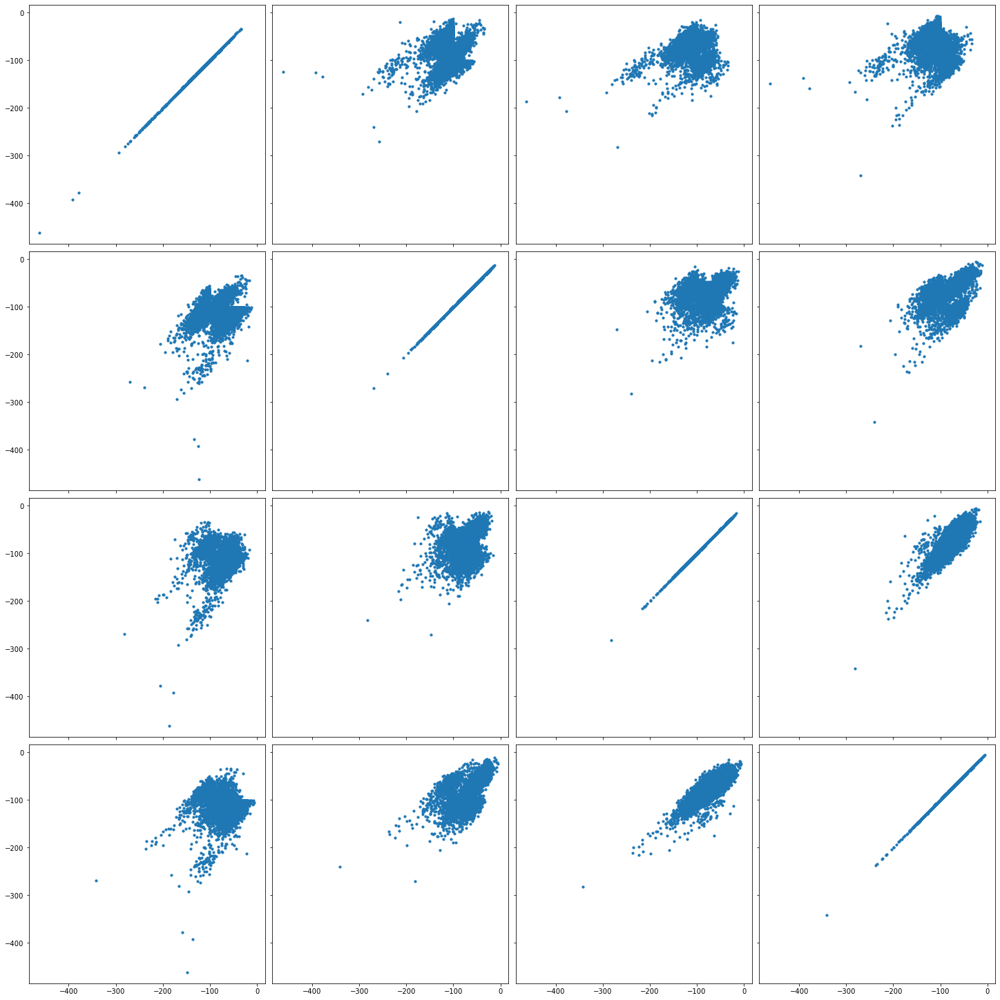

In [31]:
marks_single = (UnitMarksIndicator & {
    'nwb_file_name': nwb_copy_file_name,
    'sort_group_id': 0,
    'interval_list_name': 'pos 3 valid times',   
}).fetch_xarray()
UnitMarksIndicator.plot_all_marks(marks_single)

## Position

After the marks look good, you'll need to load/populate the 2D position data. This comes from the `IntervalPositionInfo` table. See the position tutorial for more information. Note that we will need to upsample the position data (which is done here via the `default_decoding` parameters) to match the sampling frequency that we intend to decode in (2 ms time bins or 500 Hz sampling rate)

Next we populate/load the linearized position tables. Again refer to the linear position tutorials for more information.

In [32]:
from spyglass.common.common_position import IntervalLinearizedPosition

linear_position_df = (IntervalLinearizedPosition() &
 {'nwb_file_name': nwb_copy_file_name,
  'interval_list_name': 'pos 3 valid times',
  'position_info_param_name': 'default_decoding'}
).fetch1_dataframe()

linear_position_df

/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/molly20220416_8PE2ZDGZ2V.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)


,linear_position,track_segment_id,projected_x_position,projected_y_position
time,,,,
1.650141e+09,1.206866,0,210.333753,232.796044
1.650141e+09,1.204623,0,210.333598,232.798281
1.650141e+09,1.202381,0,210.333442,232.800518
1.650141e+09,1.200138,0,210.333287,232.802755
1.650141e+09,1.197896,0,210.333131,232.804993
...,...,...,...,...
1.650143e+09,20.857202,0,211.697438,213.193083
1.650143e+09,20.840395,0,211.696271,213.209849
1.650143e+09,20.823588,0,211.695105,213.226616


We should also quickly visualize the linear position in order to sanity check the values. Here we plot the 2D position projected to its corresponding 1D segment.

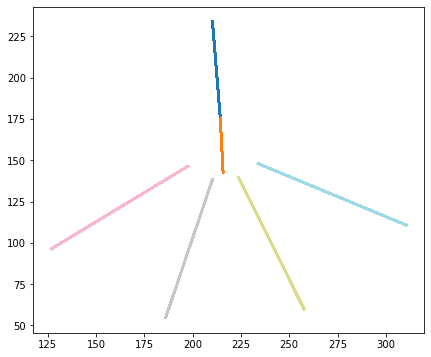

In [33]:
plt.figure(figsize=(7, 6))
plt.scatter(linear_position_df.projected_x_position, linear_position_df.projected_y_position,
            c=linear_position_df.track_segment_id, cmap='tab20', s=1)

We should also plot the linearized position itself to make sure it is okay.

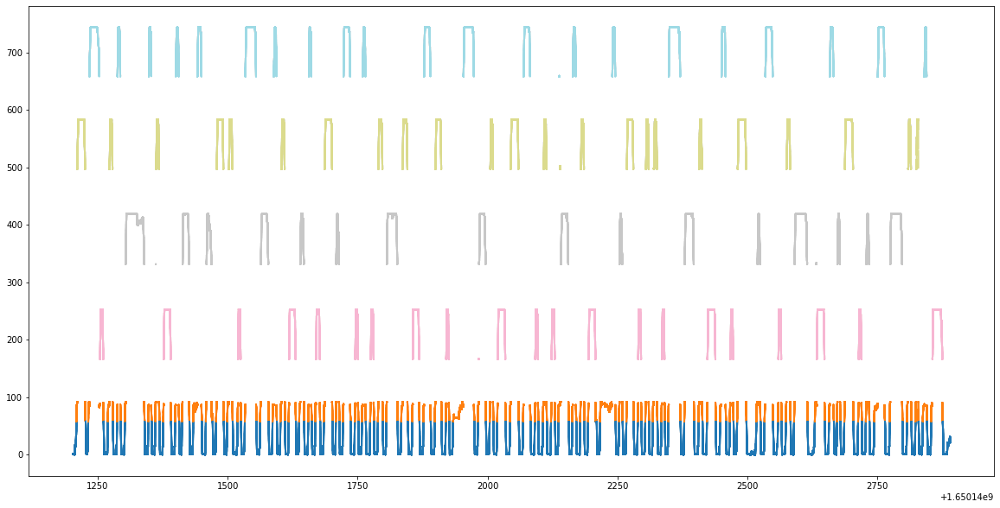

In [34]:
plt.figure(figsize=(20, 10))
plt.scatter(linear_position_df.index, linear_position_df.linear_position, s=1,
            c=linear_position_df.track_segment_id, cmap='tab20')

Okay now that we've looked at the data, we should quickly verify that all our data is the same size.

We also want to make sure we have valid ephys data and valid position data for decoding. Here we only have one valid time interval, but if we had more than one, we should decode on each interval separately.

In [36]:
sort_interval_name='04_Seq2Session2'
pos_interval_name='pos 3 valid times'

key = {}
key['interval_list_name'] = sort_interval_name
key['nwb_file_name'] = nwb_copy_file_name

interval = (IntervalList &
            {'nwb_file_name': key['nwb_file_name'],
             'interval_list_name': key['interval_list_name']}
           ).fetch1('valid_times')

valid_ephys_times = (IntervalList &
                     {'nwb_file_name': key['nwb_file_name'],
                      'interval_list_name': 'raw data valid times'}
                    ).fetch1('valid_times')
position_interval_names = (IntervalPositionInfo &
                           {'nwb_file_name': key['nwb_file_name'],
                            'position_info_param_name': 'default_decoding',
                           }
                          ).fetch('interval_list_name')

valid_pos_times = (IntervalList &
                   {'nwb_file_name': key['nwb_file_name'],
                    'interval_list_name': pos_interval_name}
                  ).fetch1('valid_times')

intersect_interval = interval_list_intersect(
    interval_list_intersect(interval, valid_ephys_times), valid_pos_times)
valid_time_slice = slice(intersect_interval[0][0], intersect_interval[0][1])
valid_time_slice

slice(1650141201.920361, 1650142890.476045, None)

In [37]:
linear_position_df = linear_position_df.loc[valid_time_slice]
marks = marks.sel(time=valid_time_slice)
#position_info = position_info.loc[valid_time_slice]

In [38]:
marks.shape, linear_position_df.shape

((844279, 4, 28), (844279, 4))

## Decoding

Okay, now having sanity checked the data, we can finally get to decoding. In the future this will be a pipeline, but for now it is manual as the table structure is still being prototyped. 

In order to set the parameters, we can fetch the default parameters and modify them.

For 1D decoding, it is best to pass in the track graph and track graph parameters we used for linearization in order for the random walk to be handled properly. We can also set the amount of smoothing in the position and mark dimensions: `position_std` and `mark_std` respectively. Finally we set the `block_size`, which controls how many samples get processed at a time so that we don't run out of GPU memory.

In [101]:
from spyglass.decoding.clusterless import ClusterlessClassifierParameters
ClusterlessClassifierParameters()

classifier_param_name a name for this set of parameters,classifier_params initialization parameters,fit_params fit parameters,predict_params prediction parameters
default_decoding_cpu,=BLOB=,=BLOB=,=BLOB=
default_decoding_gpu,=BLOB=,=BLOB=,=BLOB=


In [39]:
from replay_trajectory_classification.environments import Environment
from spyglass.common.common_position import TrackGraph
from spyglass.decoding.clusterless import ClusterlessClassifierParameters

import pprint

parameters = (ClusterlessClassifierParameters() & {'classifier_param_name': 'default_decoding_gpu'}).fetch1()

track_graph = (TrackGraph() & {'track_graph_name': '4 arm lumped'}).get_networkx_track_graph()
track_graph_params = (TrackGraph() & {'track_graph_name': '4 arm lumped'}).fetch1()

parameters['classifier_params']['environments'] = [
    Environment(
    track_graph=track_graph,
    edge_order=track_graph_params['linear_edge_order'],
    edge_spacing=track_graph_params['linear_edge_spacing'])]

parameters['classifier_params']['clusterless_algorithm'] = 'multiunit_likelihood_integer_gpu'
parameters['classifier_params']['clusterless_algorithm_params'] = {
    'mark_std': 24.0,
    'position_std': 6.0,
    'block_size': 100,
 }

pprint.pprint(parameters)

{'classifier_param_name': 'default_decoding_gpu',
 'classifier_params': {'clusterless_algorithm': 'multiunit_likelihood_integer_gpu',
                       'clusterless_algorithm_params': {'block_size': 100,
                                                        'mark_std': 24.0,
                                                        'position_std': 6.0},
                       'continuous_transition_types': [[RandomWalk(environment_name='', movement_var=6.0, movement_mean=0.0, use_diffusion=False),
                                                        Uniform(environment_name='', environment2_name=None)],
                                                       [Uniform(environment_name='', environment2_name=None),
                                                        Uniform(environment_name='', environment2_name=None)]],
                       'discrete_transition_type': DiagonalDiscrete(diagonal_value=0.98),
                       'environments': [Environment(environment_name=

After we set the parameters, we can run the decoding.

In [40]:
from replay_trajectory_classification import ClusterlessClassifier

GPU_ID=0
with cp.cuda.Device(GPU_ID):
    classifier = ClusterlessClassifier(**parameters['classifier_params'])
    classifier.fit(
        position=linear_position_df.linear_position.values,
        multiunits=marks.values,
        **parameters['fit_params']
    )
    results = classifier.predict(
        multiunits=marks.values,
        time=linear_position_df.index,
        **parameters['predict_params']
    )
    logging.info('Done!')

15-Jun-22 22:46:02 Fitting initial conditions...
15-Jun-22 22:46:02 Fitting continuous state transition...
/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/replay_trajectory_classification/continuous_state_transitions.py:12: RuntimeWarning: invalid value encountered in true_divide
  x /= x.sum(axis=1, keepdims=True)
15-Jun-22 22:46:03 Fitting discrete state transition
15-Jun-22 22:46:03 Fitting multiunits...
15-Jun-22 22:46:08 Estimating likelihood...


n_electrodes:   0%|          | 0/28 [00:00<?, ?it/s]

/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/replay_trajectory_classification/likelihoods/multiunit_likelihood_integer_gpu.py:446: RuntimeWarning: overflow encountered in add
  log_likelihood[np.ix_(is_spike, is_track_interior)] += np.nan_to_num(
15-Jun-22 22:46:51 Estimating causal posterior...
15-Jun-22 22:49:39 Estimating acausal posterior...
15-Jun-22 22:55:55 Done!


In [142]:
results

<xarray.Dataset>
Dimensions:            (time: 844279, state: 2, position: 301)
Coordinates:
  * time               (time) float64 1.65e+09 1.65e+09 ... 1.65e+09 1.65e+09
  * position           (position) float64 0.9938 2.981 4.969 ... 740.1 742.0
  * state              (state) <U10 'Continuous' 'Uniform'
Data variables:
    likelihood         (time, state, position) float32 0.4807 0.4838 ... 0.5916
    causal_posterior   (time, state, position) float32 0.001012 ... 0.0002184
    acausal_posterior  (time, state, position) float32 1.074e-05 ... 0.0002184
Attributes:
    data_log_likelihood:  -307048.38

In [43]:
key={'nwb_file_name':nwb_copy_file_name,
     'interval_list_name':sort_interval_name,
     'posterior':results.to_dict()}
#

In [ ]:
Decode().insert1(key,replace=True)

/home/shijiegu/anaconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/blob.py:199: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated since Python 3.3, and in 3.10 it will stop working
  if isinstance(obj, collections.Sequence):


Finally, we can plot the decodes to make sure they make sense.

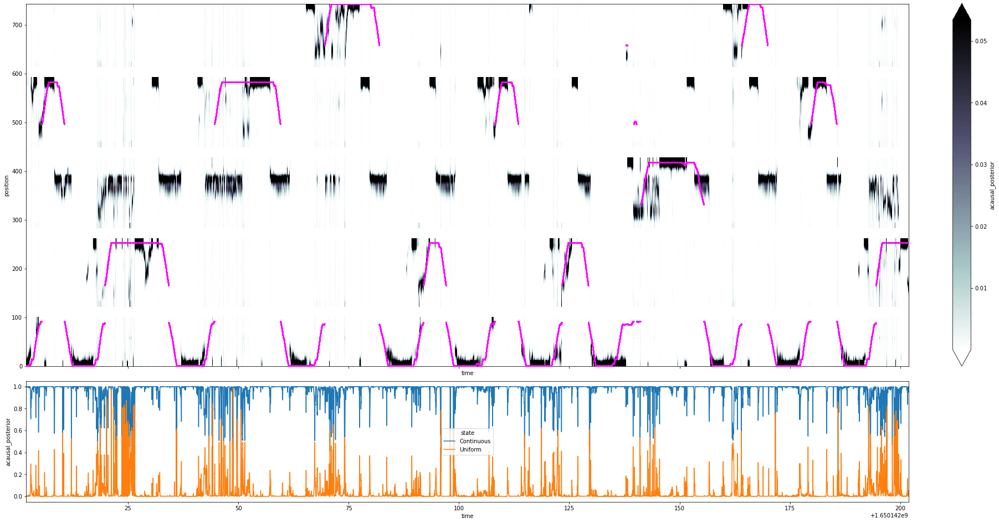

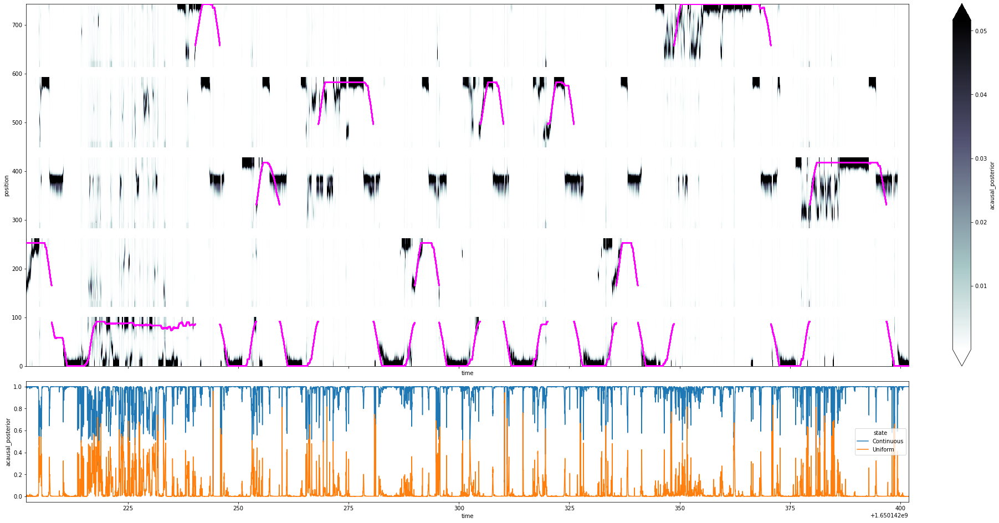

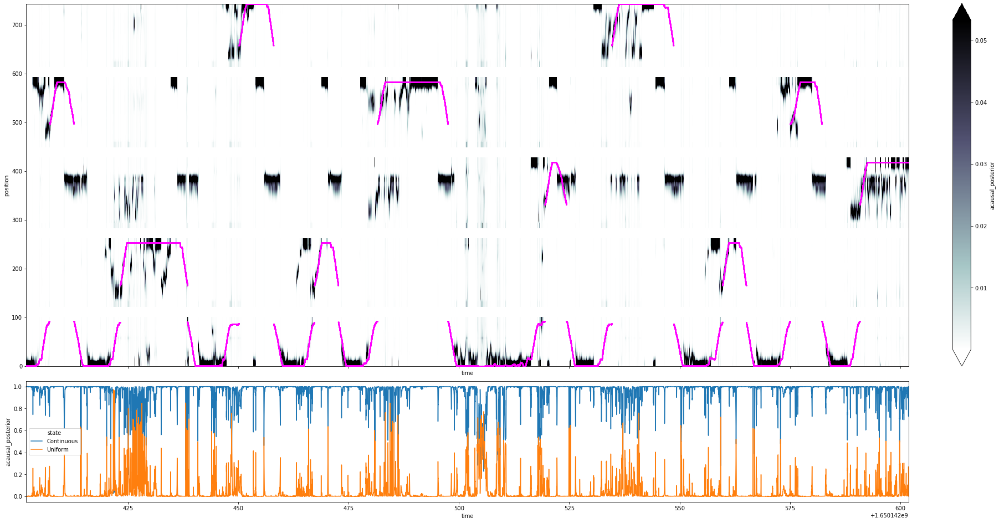

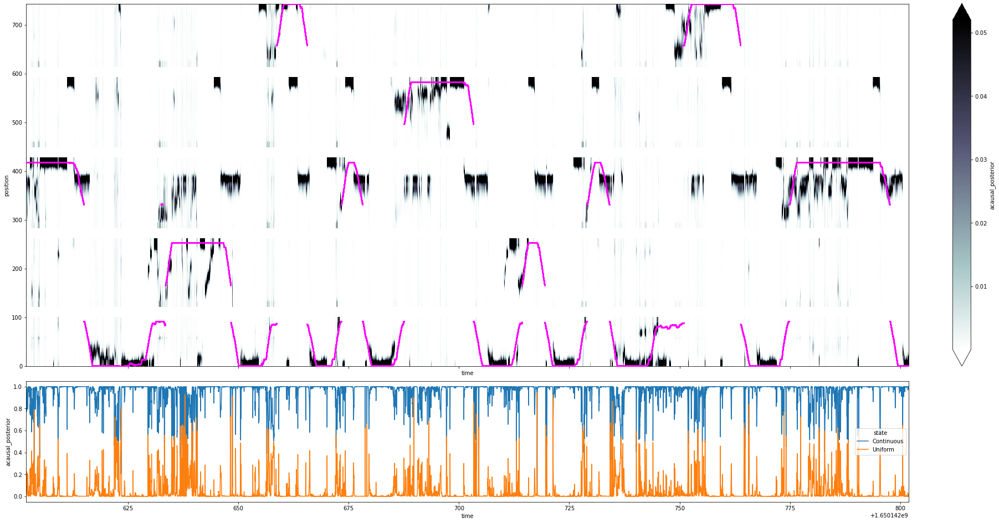

In [41]:
import matplotlib.pyplot as plt
for time_ind in range(400_000, 800_000, 100_000):
    time_slice = slice(time_ind, time_ind + 100_000)

    fig, axes = plt.subplots(2, 1, figsize=(25, 13), sharex=True, constrained_layout=True, gridspec_kw={"height_ratios": [3, 1]},)
    results.isel(time=time_slice).acausal_posterior.sum('state').plot(x='time', y='position', ax=axes[0], robust=True, cmap='bone_r')
    axes[0].scatter(linear_position_df.iloc[time_slice].index,
                    linear_position_df.iloc[time_slice].linear_position.values,
                    s=1, color='magenta', zorder=10)

    results.isel(time=time_slice).acausal_posterior.sum('position').plot(x='time', hue='state', ax=axes[1])

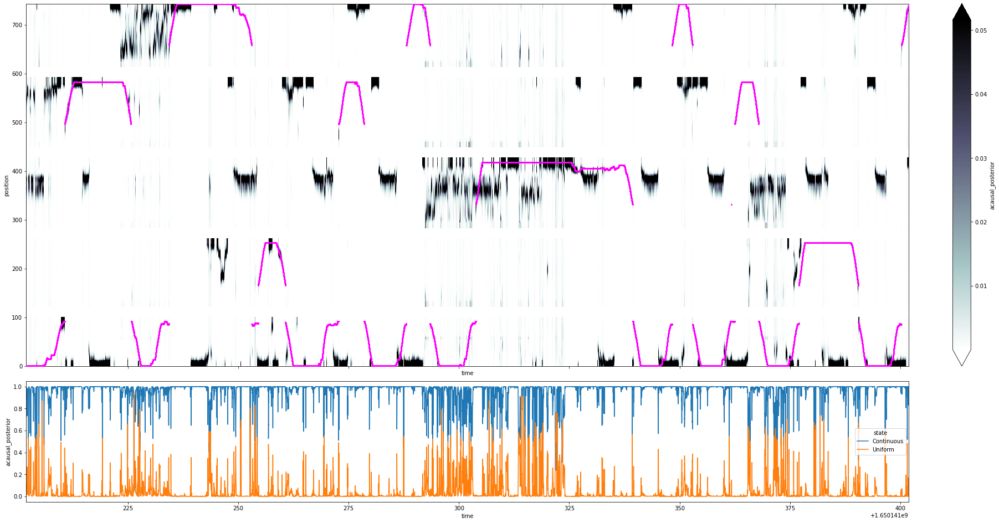

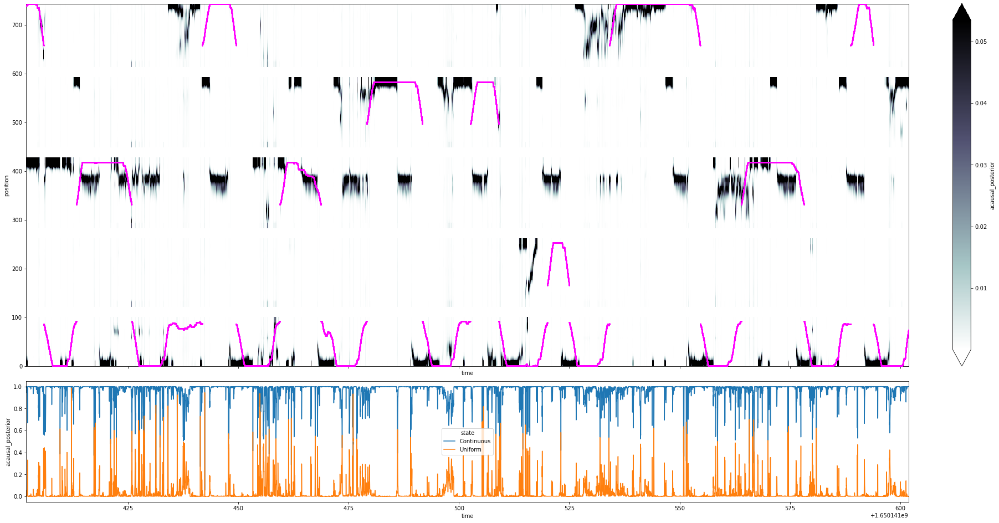

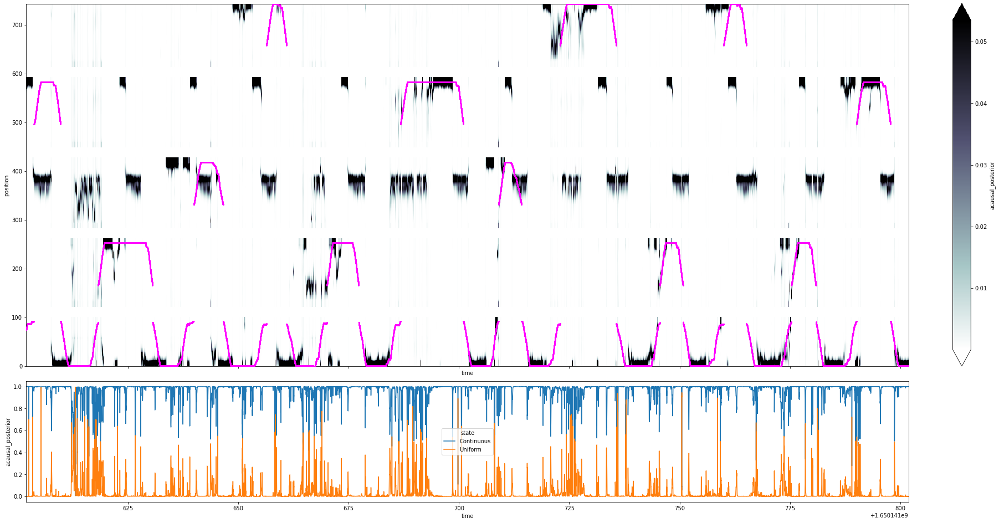

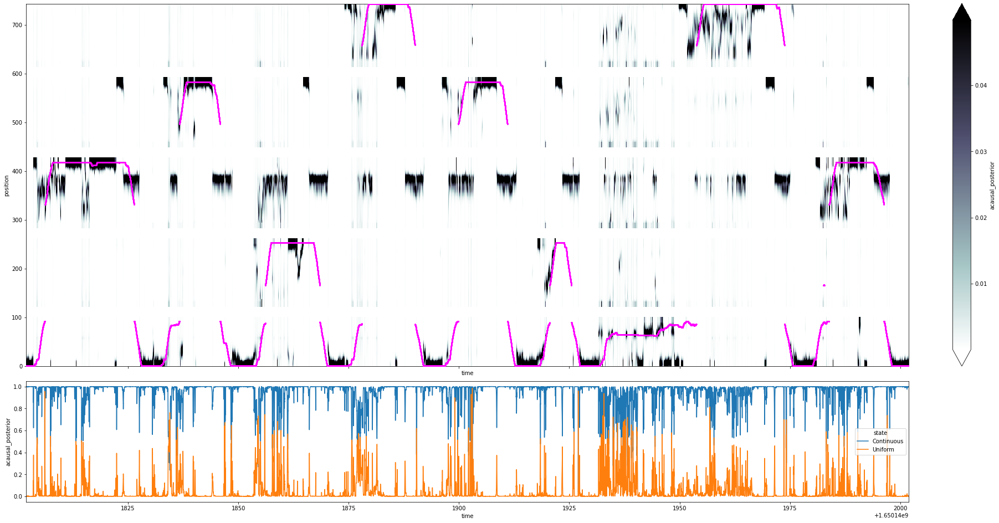

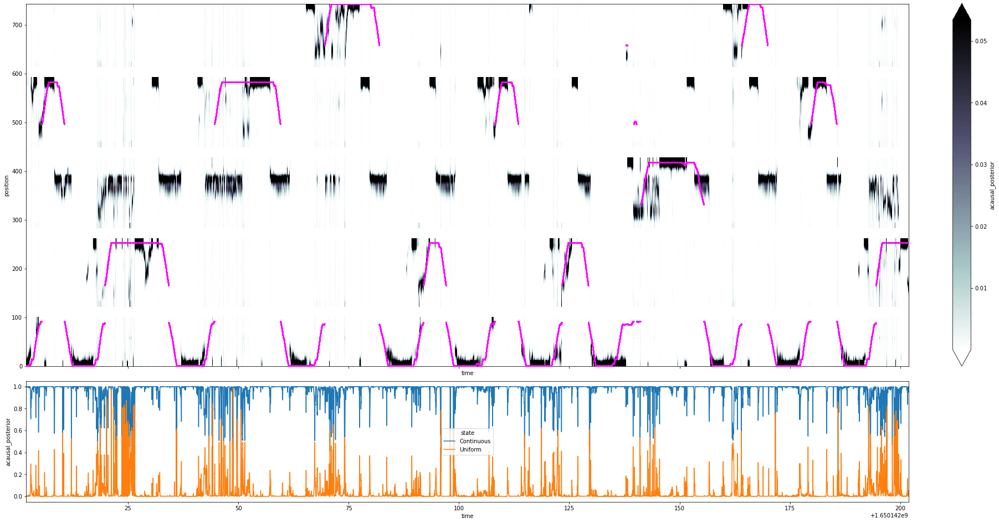

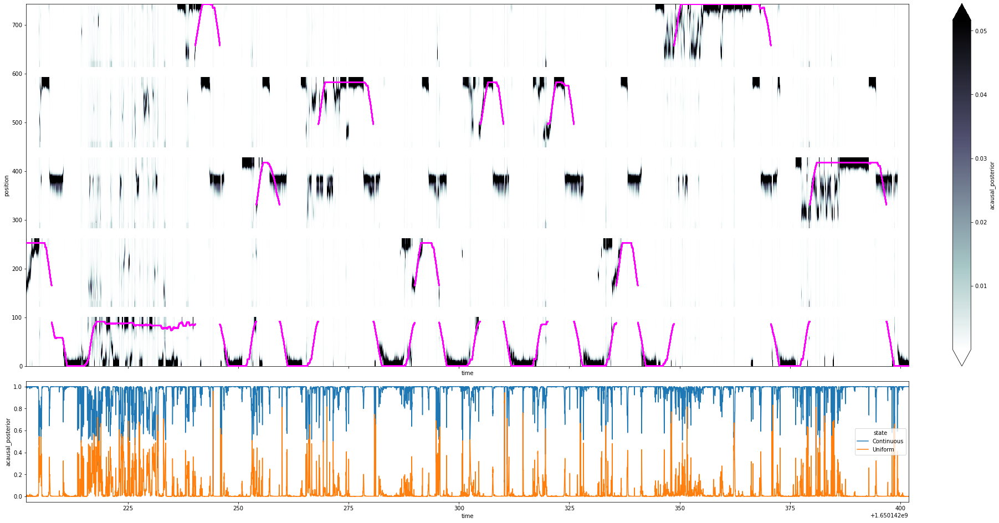

In [42]:
import matplotlib.pyplot as plt
for time_ind in range(0, 600_000, 100_000):
    time_slice = slice(time_ind, time_ind + 100_000)

    fig, axes = plt.subplots(2, 1, figsize=(25, 13), sharex=True, constrained_layout=True, gridspec_kw={"height_ratios": [3, 1]},)
    results.isel(time=time_slice).acausal_posterior.sum('state').plot(x='time', y='position', ax=axes[0], robust=True, cmap='bone_r')
    axes[0].scatter(linear_position_df.iloc[time_slice].index,
                    linear_position_df.iloc[time_slice].linear_position.values,
                    s=1, color='magenta', zorder=10)

    results.isel(time=time_slice).acausal_posterior.sum('position').plot(x='time', hue='state', ax=axes[1])

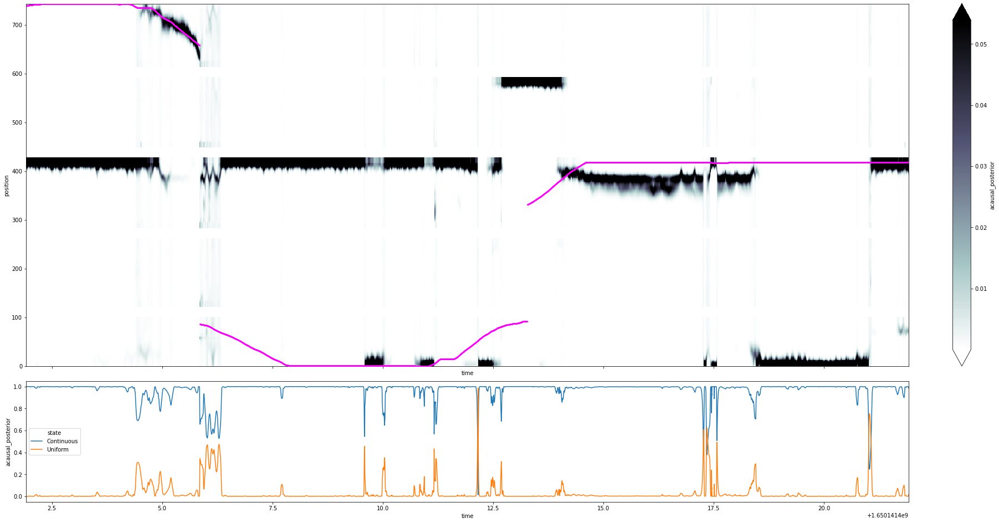

In [144]:
import matplotlib.pyplot as plt

time_slice = slice(100_000, 110_000)

fig, axes = plt.subplots(2, 1, figsize=(25, 13), sharex=True, constrained_layout=True, gridspec_kw={"height_ratios": [3, 1]},)

results.isel(time=time_slice).acausal_posterior.sum('state').plot(x='time', y='position', ax=axes[0], robust=True, cmap='bone_r')
axes[0].scatter(linear_position_df.iloc[time_slice].index,
                linear_position_df.iloc[time_slice].linear_position.values,
                s=1, color='magenta', zorder=10)

results.isel(time=time_slice).acausal_posterior.sum('position').plot(x='time', hue='state', ax=axes[1])

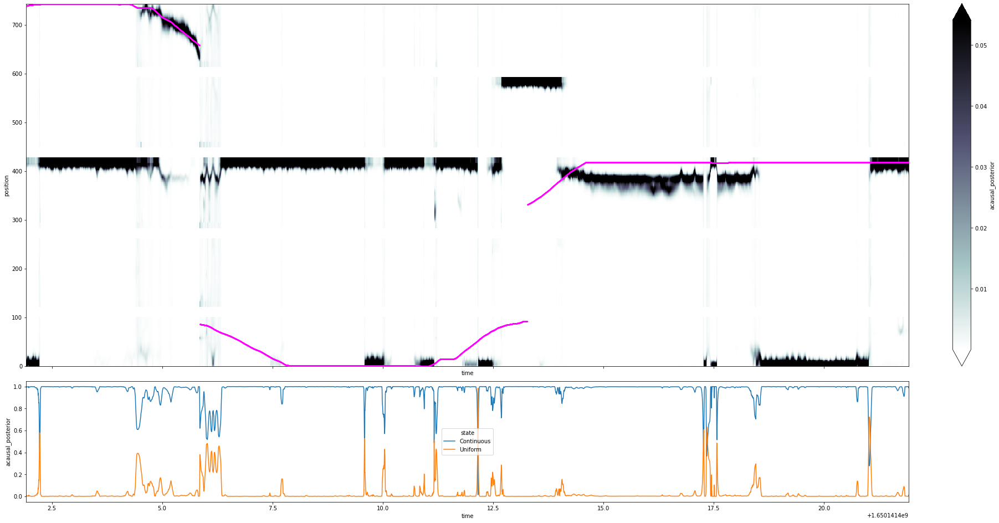

In [21]:
import matplotlib.pyplot as plt

time_slice = slice(100_000, 110_000)

fig, axes = plt.subplots(2, 1, figsize=(25, 13), sharex=True, constrained_layout=True, gridspec_kw={"height_ratios": [3, 1]},)

results.isel(time=time_slice).acausal_posterior.sum('state').plot(x='time', y='position', ax=axes[0], robust=True, cmap='bone_r')
axes[0].scatter(linear_position_df.iloc[time_slice].index,
                linear_position_df.iloc[time_slice].linear_position.values,
                s=1, color='magenta', zorder=10)

results.isel(time=time_slice).acausal_posterior.sum('position').plot(x='time', hue='state', ax=axes[1])

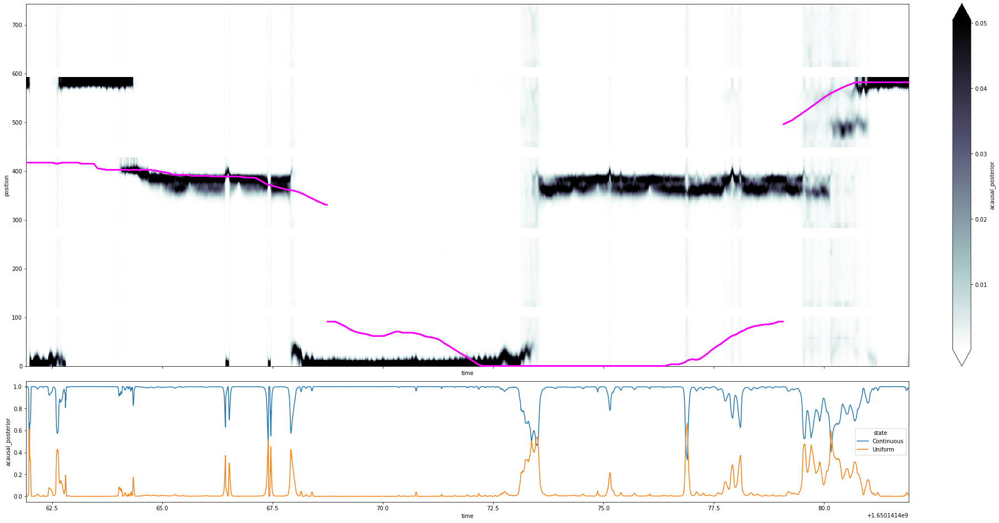

In [145]:
import matplotlib.pyplot as plt

time_slice = slice(130_000, 140_000)

fig, axes = plt.subplots(2, 1, figsize=(25, 13), sharex=True, constrained_layout=True, gridspec_kw={"height_ratios": [3, 1]},)

results.isel(time=time_slice).acausal_posterior.sum('state').plot(x='time', y='position', ax=axes[0], robust=True, cmap='bone_r')
axes[0].scatter(linear_position_df.iloc[time_slice].index,
                linear_position_df.iloc[time_slice].linear_position.values,
                s=1, color='magenta', zorder=10)

results.isel(time=time_slice).acausal_posterior.sum('position').plot(x='time', hue='state', ax=axes[1])

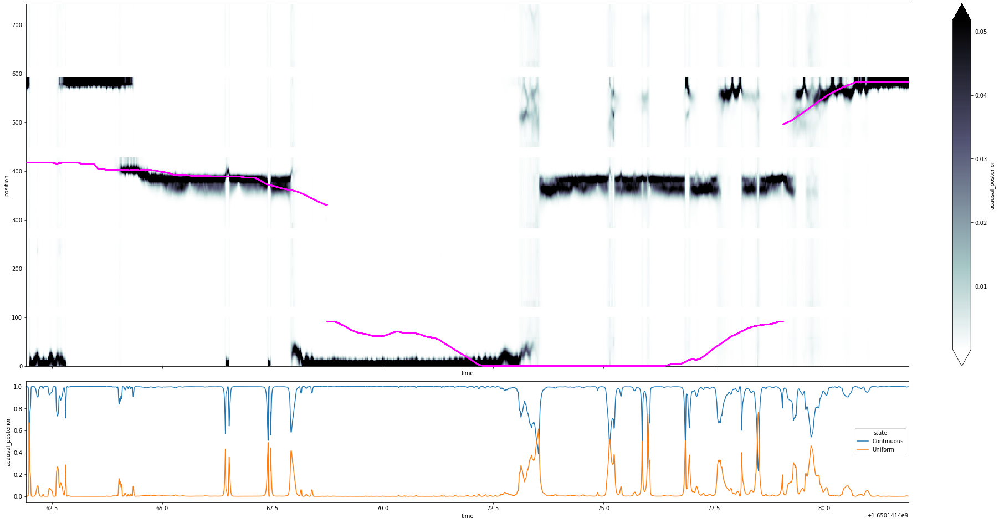

In [22]:
import matplotlib.pyplot as plt

time_slice = slice(130_000, 140_000)

fig, axes = plt.subplots(2, 1, figsize=(25, 13), sharex=True, constrained_layout=True, gridspec_kw={"height_ratios": [3, 1]},)

results.isel(time=time_slice).acausal_posterior.sum('state').plot(x='time', y='position', ax=axes[0], robust=True, cmap='bone_r')
axes[0].scatter(linear_position_df.iloc[time_slice].index,
                linear_position_df.iloc[time_slice].linear_position.values,
                s=1, color='magenta', zorder=10)

results.isel(time=time_slice).acausal_posterior.sum('position').plot(x='time', hue='state', ax=axes[1])

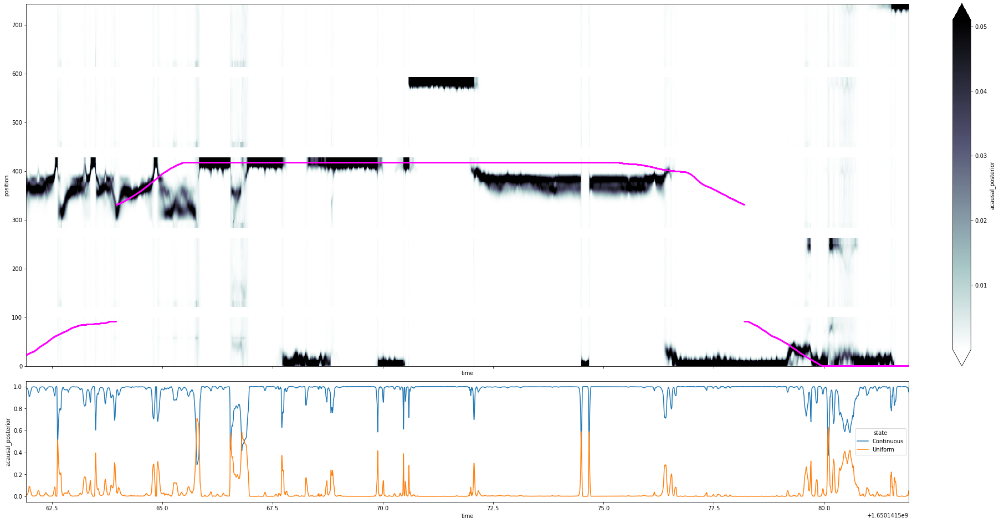

In [23]:
import matplotlib.pyplot as plt

time_slice = slice(180_000, 190_000)

fig, axes = plt.subplots(2, 1, figsize=(25, 13), sharex=True, constrained_layout=True, gridspec_kw={"height_ratios": [3, 1]},)

results.isel(time=time_slice).acausal_posterior.sum('state').plot(x='time', y='position', ax=axes[0], robust=True, cmap='bone_r')
axes[0].scatter(linear_position_df.iloc[time_slice].index,
                linear_position_df.iloc[time_slice].linear_position.values,
                s=1, color='magenta', zorder=10)

results.isel(time=time_slice).acausal_posterior.sum('position').plot(x='time', hue='state', ax=axes[1])

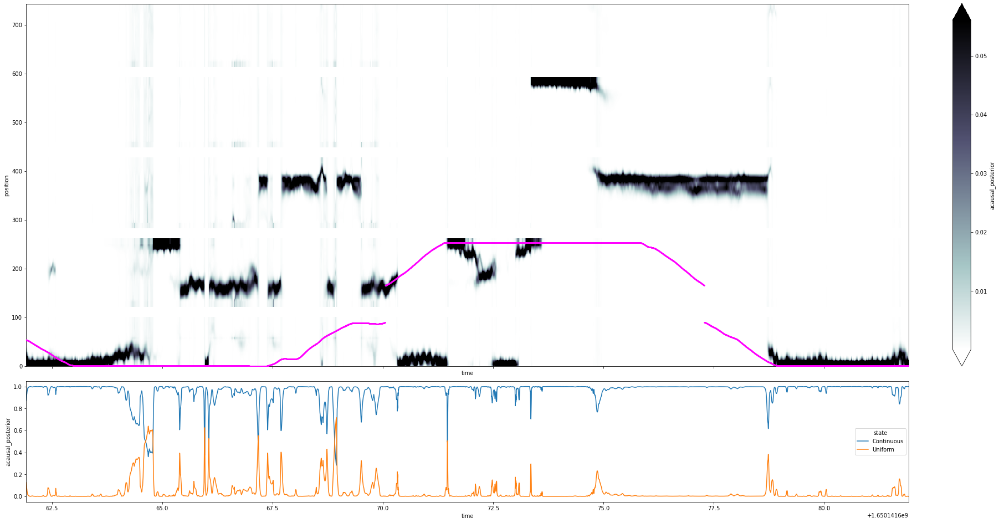

In [24]:
import matplotlib.pyplot as plt

time_slice = slice(230_000, 240_000)

fig, axes = plt.subplots(2, 1, figsize=(25, 13), sharex=True, constrained_layout=True, gridspec_kw={"height_ratios": [3, 1]},)

results.isel(time=time_slice).acausal_posterior.sum('state').plot(x='time', y='position', ax=axes[0], robust=True, cmap='bone_r')
axes[0].scatter(linear_position_df.iloc[time_slice].index,
                linear_position_df.iloc[time_slice].linear_position.values,
                s=1, color='magenta', zorder=10)

results.isel(time=time_slice).acausal_posterior.sum('position').plot(x='time', hue='state', ax=axes[1])

In [25]:
from trajectory_analysis_tools import get_trajectory_data, get_ahead_behind_distance

trajectory_data = get_trajectory_data(
    results.sum('state').acausal_posterior,
    track_graph,
    classifier,
    linear_position_df[['projected_x_position', 'projected_y_position']],
    linear_position_df.track_segment_id,
    position_info.head_orientation,
)

ahead_behind_distance = get_ahead_behind_distance(
    track_graph, *trajectory_data)
mental_position_edges = trajectory_data[-1]
mental_position_edge_id = np.asarray(
    [track_graph.edges[edge]['edge_id'] for edge in mental_position_edges])

NameError: name 'position_info' is not defined

In [30]:
from ripple_detection import get_multiunit_population_firing_rate

SAMPLING_FREQUENCY = 500

multiunit_spikes = (np.any(~np.isnan(marks.values), axis=1)
                    ).astype(float)
multiunit_firing_rate = pd.DataFrame(
    get_multiunit_population_firing_rate(
        multiunit_spikes, SAMPLING_FREQUENCY), index=marks.time,
    columns=['firing_rate'])

In [31]:
from ripple_detection import multiunit_HSE_detector

multiunit_high_synchrony_times = multiunit_HSE_detector(
    marks.time.values,
    multiunit_spikes,
    position_info.head_speed.values,
    sampling_frequency=SAMPLING_FREQUENCY,
    minimum_duration=0.015,
    zscore_threshold=2.0,
    close_event_threshold=0.000)

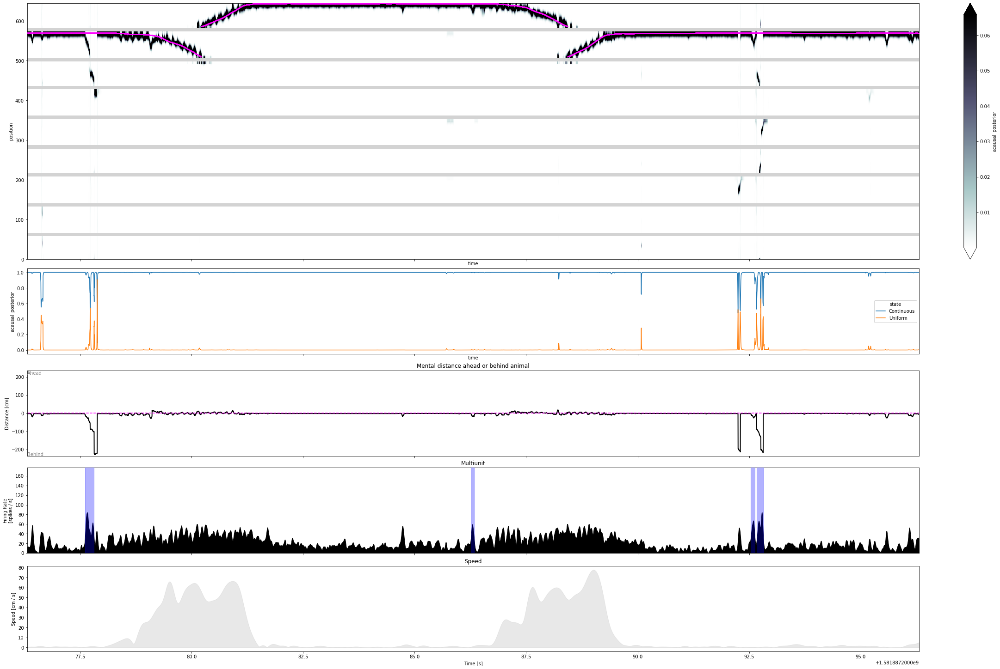

In [32]:
import matplotlib.pyplot as plt
import copy


def plot_classifier(
    time_slice,
    results,
    classifier,
    position_info,
    linear_position_df,
    ahead_behind_distance,
    multiunit_firing_rate,
    multiunit_high_synchrony_times,
    cmap='bone_r',
    figsize=(30, 20)
):

    cmap = copy.copy(plt.cm.get_cmap(cmap))
    cmap.set_bad(color="lightgrey", alpha=1.0)

    fig, axes = plt.subplots(5, 1, figsize=figsize, sharex=True, constrained_layout=True,
                             gridspec_kw={"height_ratios": [3, 1, 1, 1, 1]},)

    time = results.isel(time=time_slice).time
    (results
     .isel(time=time_slice)
     .acausal_posterior
     .sum('state')
     .where(classifier.environments[0].is_track_interior_)
     .plot(x='time', y='position', ax=axes[0], robust=True, cmap=cmap))
    axes[0].scatter(time,
                    linear_position_df.iloc[time_slice].linear_position.values,
                    s=1, color='magenta', zorder=10)

    results.isel(time=time_slice).acausal_posterior.sum('position').plot(x='time', hue='state', ax=axes[1])
    axes[2].plot(time,
                 ahead_behind_distance[time_slice],
                 color="black", linewidth=2)
    axes[2].axhline(0, color="magenta", linestyle="--")
    axes[2].set_title("Mental distance ahead or behind animal")
    axes[2].set_ylabel("Distance [cm]")
    max_dist = np.max(np.abs(ahead_behind_distance)) + 5
    axes[2].set_ylim((-max_dist, max_dist))
    axes[2].text(time[0], max_dist - 1, "Ahead", color="grey", va='top')
    axes[2].text(time[0], -max_dist + 1, "Behind", color="grey")

    # ax 3
    axes[3].fill_between(
        multiunit_firing_rate.iloc[time_slice].index.values,
        multiunit_firing_rate.iloc[time_slice].values.squeeze(),
        color="black",
    )
    axes[3].set_ylabel("Firing Rate\n[spikes / s]")
    axes[3].set_title("Multiunit")
    axes[3].set_ylim((0.0, np.max(np.asarray(multiunit_firing_rate))))


    cur_multiunit_HSE = interval_list_intersect(
        np.asarray(multiunit_high_synchrony_times),
        np.asarray([(time[0], time[-1])]))

    for start_time, end_time in cur_multiunit_HSE:
        axes[3].axvspan(start_time, end_time, color='blue', alpha=0.3, zorder=10)

    # ax 4
    axes[4].fill_between(
        time,
        position_info.iloc[time_slice]
        .head_speed.values.squeeze(),
        color="lightgrey",
        linewidth=1,
        alpha=0.5,
    )
    axes[4].set_title('Speed')
    axes[4].set_ylabel("Speed [cm / s]")
    axes[4].set_xlabel("Time [s]")
    

time_slice = slice(180_000, 190_000)
plot_classifier(time_slice, results, classifier, position_info, linear_position_df, ahead_behind_distance,
                multiunit_firing_rate, multiunit_high_synchrony_times)

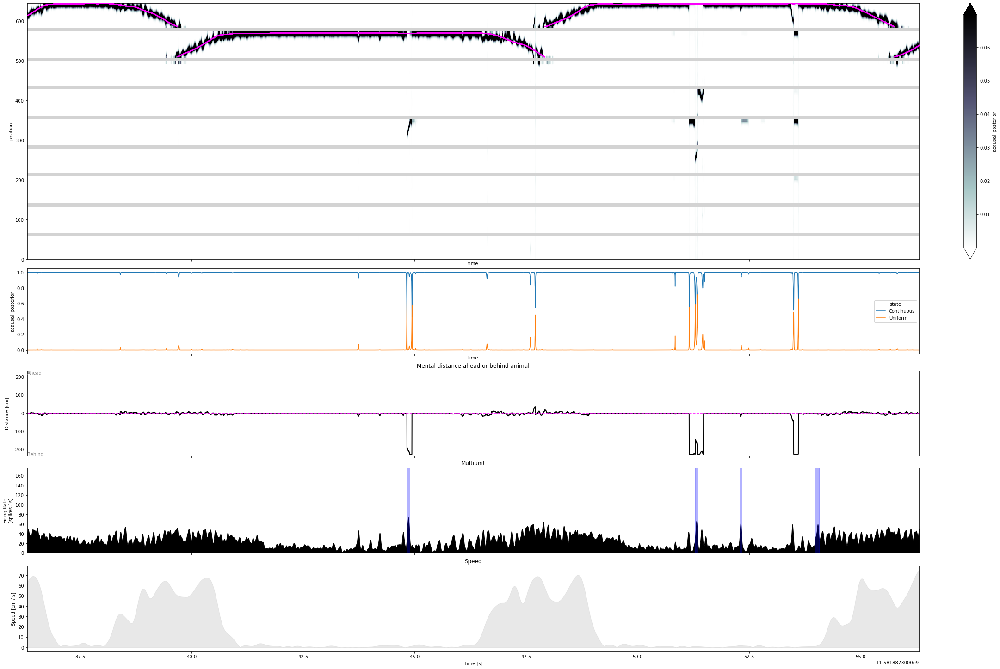

In [33]:
time_slice = slice(210_000, 220_000)
plot_classifier(time_slice, results, classifier, position_info, linear_position_df, ahead_behind_distance,
                multiunit_firing_rate, multiunit_high_synchrony_times)

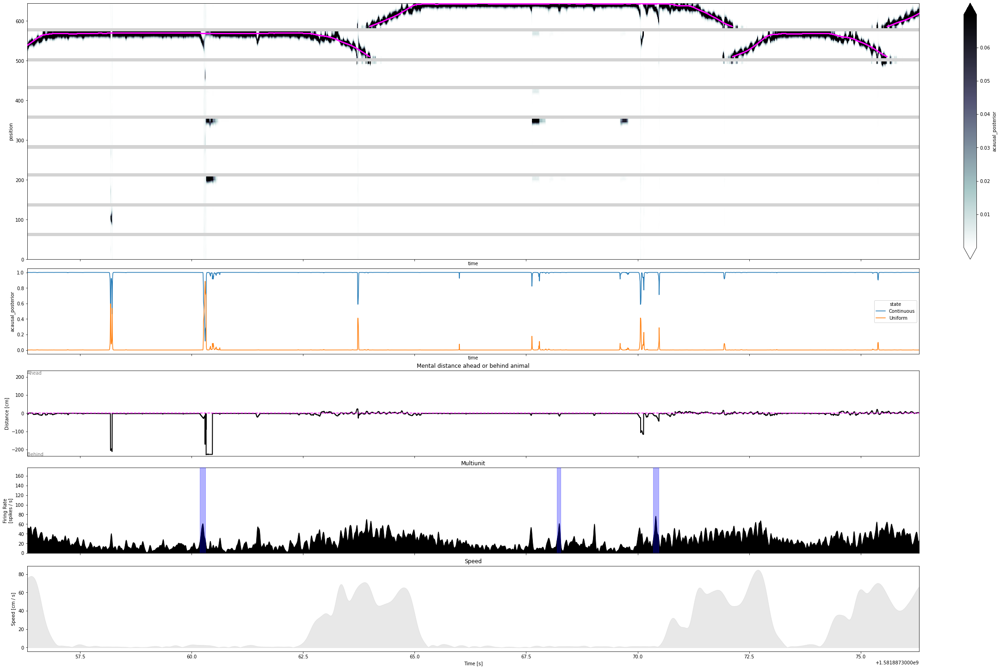

In [34]:
time_slice = slice(220_000, 230_000)
plot_classifier(time_slice, results, classifier, position_info, linear_position_df, ahead_behind_distance,
                multiunit_firing_rate, multiunit_high_synchrony_times)